# Classifying near-Antarctic profiles

## Initial setup

### Load modules

In [143]:
# modules in this package
import load_and_preprocess as lp
import analysis as at
import bic_and_aic as ba
import plot_tools as pt
import file_io as io
import numpy as np
import xarray
import density
import gmm
# plotting tools
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cmx
import matplotlib as mpl
import cmocean
# os tools
import os.path

# suppress a particular warning
import warnings
warnings.filterwarnings('ignore', 'RuntimeWarning: All-NaN slice encountered')

### Set runtime parameters (file locations, etc.)

In [2]:
# set locations and names
descrip = 'WeddellOnly' # extra description for filename
data_location = '../../so-chic-data/' # input data location
classified_data_location = 'models/profiles_-65to80lon_-85to-30lat_20to1000depth_5K_allDomain_revised.nc'
ploc = 'plots/plots_WeddellClassOnly_top1000m_K04_forPaper/'
#ploc = 'tests/'
dloc = 'models/'

# if plot directory doesn't exist, create it
if not os.path.exists(ploc):
    os.makedirs(ploc)

# single class from previous effort to sub-classify
# don't forget 0 indexing
myClass=1

# calculate BIC and AIC? set max number of components
getBIC = False 
max_N = 20


# save the processed output as a NetCDF file?
saveOutput = False

# number of PCA components (roughly 95%)
n_pca = 6

# make decision about n_components_selected (iterative part of analysis)
n_components_selected = 4

#longitude and latitude range
lon_min = -65
lon_max =  80
lat_min = -80
lat_max = -45
# depth range
zmin = 20.0
zmax = 1000.0
# density range
sig0range = (26.6, 28.0)

# temperature and salinity ranges for plotting
lon_range=(lon_min, lon_max)
lat_range=(lat_min, lat_max)
Trange=(-2.2, 6.0)
Srange=(33.5, 35.0)

# create filename for saving GMM and saving labelled profiles
pca_fname = dloc + 'pca_' + str(int(lon_min)) + 'to' + str(int(lon_max)) + 'lon_' + str(int(lat_min)) + 'to' + str(int(lat_max)) + 'lat_' + str(int(zmin)) + 'to' + str(int(zmax)) + 'depth_' + str(int(n_pca)) + descrip
gmm_fname = dloc + 'gmm_' + str(int(lon_min)) + 'to' + str(int(lon_max)) + 'lon_' + str(int(lat_min)) + 'to' + str(int(lat_max)) + 'lat_' + str(int(zmin)) + 'to' + str(int(zmax)) + 'depth_' + str(int(n_components_selected)) + 'K_' + descrip
fname = dloc + 'profiles_' + str(int(lon_min)) + 'to' + str(int(lon_max)) + 'lon_' + str(int(lat_min)) + 'to' + str(int(lat_max)) + 'lat_' + str(int(zmin)) + 'to' + str(int(zmax)) + 'depth_' + str(int(n_components_selected)) + 'K_' + descrip + '.nc'

# colormap
colormap = plt.get_cmap('Dark2', n_components_selected)
colormap_cividis = plt.get_cmap('cividis', 20)

### Load profile data from the Antarctic class (identified in notebook: 1_profile_distribution.ipynb)

load_and_preprocess.load_single_class
----> single-class profiles loaded
plot_tools.plot_profiles


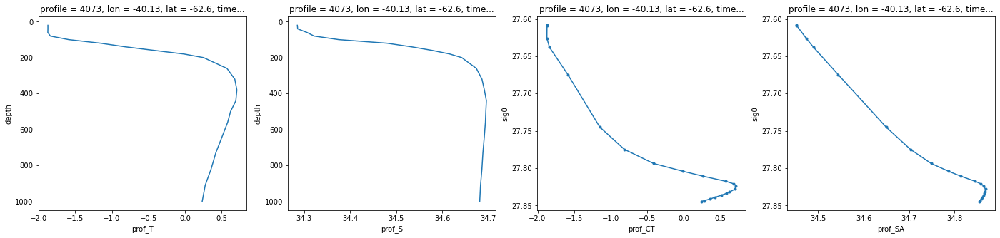

In [3]:
# load single class (just the Weddell One)
profiles = lp.load_single_class(classified_data_location, selected_class=myClass)

# plot random profile
pt.plot_profile(ploc, profiles.isel(profile=1400))

## Dimensionality reduction via PCA

### Carry out principal component expansion

load_and_preprocess.fit_and_apply_pca
load_and_preprocess.apply_scaling
load_and_preprocess.apply_scaling: using depth levels
Fitting PCA
0.9466271674333676
file_io.save_pca
plot_tools.plot_pca


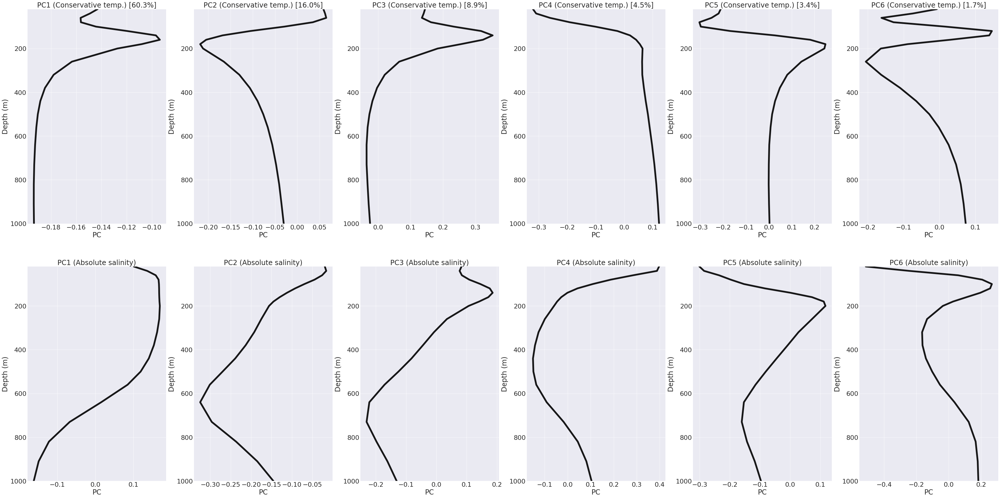

In [4]:
# if trained PCA already exists, load it
if os.path.isfile(pca_fname):
    pca = io.load_pca(pca_fname)
    Xtrans = lp.apply_pca(profiles, pca)
# otherwise, go ahead and train it
else:
    # apply PCA
    pca, Xtrans = lp.fit_and_apply_pca(profiles,
                                       number_of_pca_components=n_pca,
                                       train_frac=0.99)
    # save for future use
    io.save_pca(pca_fname, pca)

# plot PCA structure
pt.plot_pca_vertical_structure(ploc, profiles, pca, Xtrans)

### Examine pairplot of principal component coefficients

plot_tools.plot_pairs


<Figure size 1080x1080 with 0 Axes>

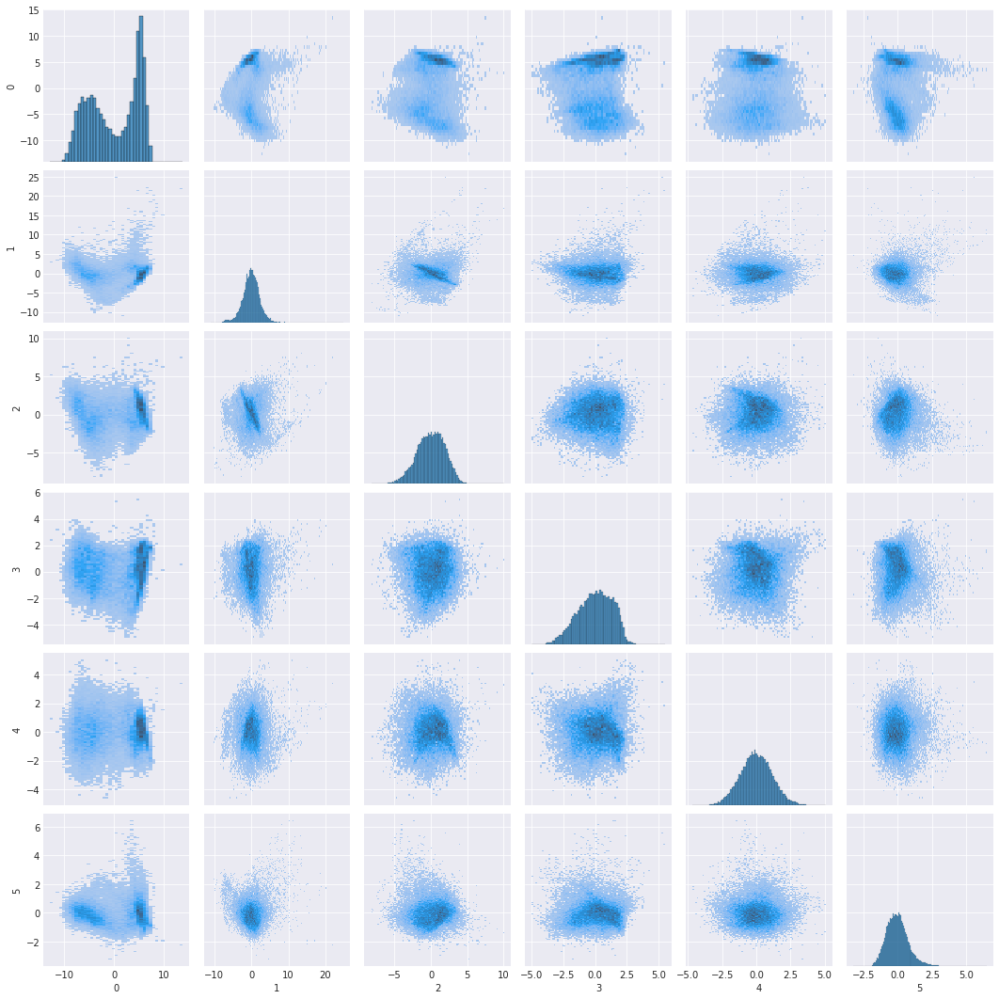

In [5]:
# pairplot of transformed variables
pt.plot_pairs(ploc, Xtrans, kind='hist', descr='pca')

### Determining the number of classes: statistical guidance

In [6]:
# calculate BIC and AIC
if getBIC==True:
    bic_mean, bic_std, aic_mean, aic_std = ba.calc_bic_and_aic(Xtrans, max_N)
    pt.plot_bic_scores(ploc, max_N, bic_mean, bic_std)
    pt.plot_aic_scores(ploc, max_N, aic_mean, aic_std)

## Classification analysis using GMM

### Profile classificaiton

In [7]:
# if GMM exists, load it. Otherwise, create it.
if os.path.isfile(gmm_fname):
    best_gmm = io.load_gmm(gmm_fname)
else:
    best_gmm = gmm.train_gmm(Xtrans, n_components_selected)
    io.save_gmm(gmm_fname, best_gmm)

# apply either loaded or created GMM
profiles = gmm.apply_gmm(profiles, Xtrans, best_gmm, n_components_selected)

# calculate class statistics
class_means, class_stds = gmm.calc_class_stats(profiles)

gmm.train_gmm
file_io.save_gmm
gmm.apply_gmm
gmm.calc_class_stats


### tSNE to check class separation

/srv/conda/envs/notebook/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


plot_tools.plot_tsne


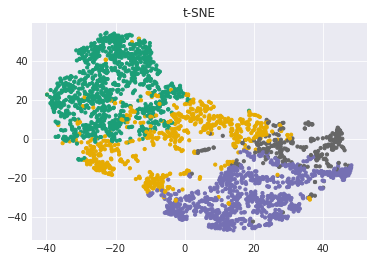

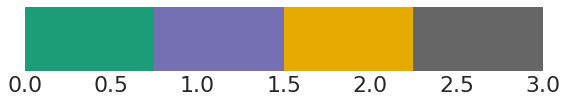

In [8]:
# fit and apply tsne
tSNE_data, colors_for_tSNE = lp.fit_and_apply_tsne(profiles, Xtrans)

# plot t-SNE with class labels
pt.plot_tsne(ploc, colormap, tSNE_data, colors_for_tSNE)

## Analyze class properties

### Examine the Dataset

In [9]:
# simplify Dataset for plotting purposes
dfp = profiles
dfp = dfp.drop({'depth_highz','sig0_levs','prof_T','prof_S','ct_on_highz',
                'sa_on_highz','sig0_on_highz','ct_on_sig0','sa_on_sig0'})
dfp

<xarray.Dataset>
Dimensions:        (profile: 28397, depth: 21, CLASS: 4)
Coordinates:
  * profile        (profile) int64 13 14 15 16 ... 142282 142301 142320 142330
    lon            (profile) float64 ...
    lat            (profile) float64 ...
  * depth          (depth) float64 20.0 40.0 60.0 80.0 ... 820.0 910.0 1e+03
    time           (profile) datetime64[ns] ...
    year           (profile) int64 ...
    month          (profile) int64 ...
  * CLASS          (CLASS) int64 0 1 2 3
Data variables:
    prof_date      (profile) float64 ...
    prof_YYYYMMDD  (profile) float64 ...
    prof_HHMMSS    (profile) float64 ...
    sig0           (profile, depth) float64 ...
    prof_SA        (profile, depth) float64 33.58 33.82 34.19 ... 34.9 34.9 34.9
    prof_CT        (profile, depth) float64 -0.1931 -0.8729 ... 1.535 1.466
    label          (profile) int64 3 2 0 2 2 1 3 1 3 2 2 ... 0 0 0 0 0 0 0 0 0 0
    posteriors     (profile, CLASS) float64 3.449e-27 5.507e-26 ... 6.32e-10

### Examine 3D view of classes in PCA space

This is a projection of the full 6D PCA space in which the clustering occurs

plot_tools.plot_pca3D


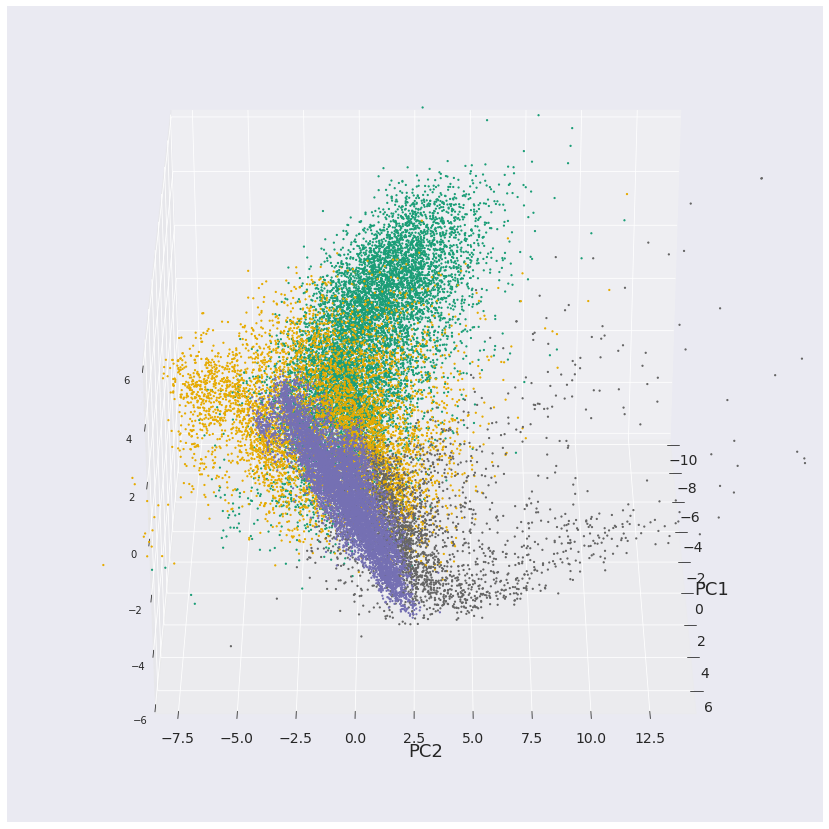

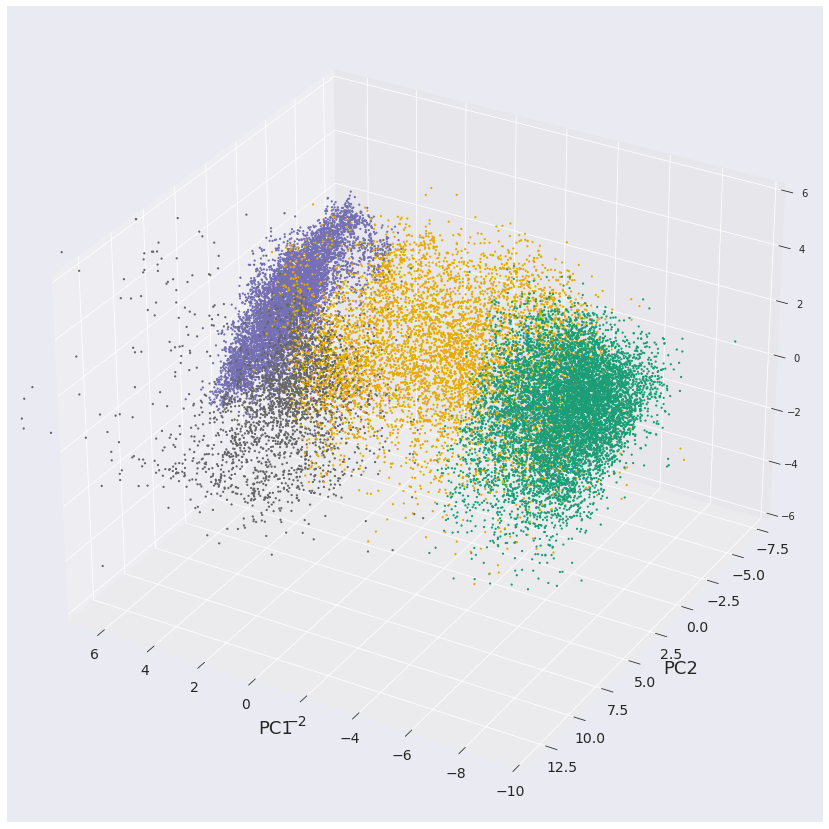

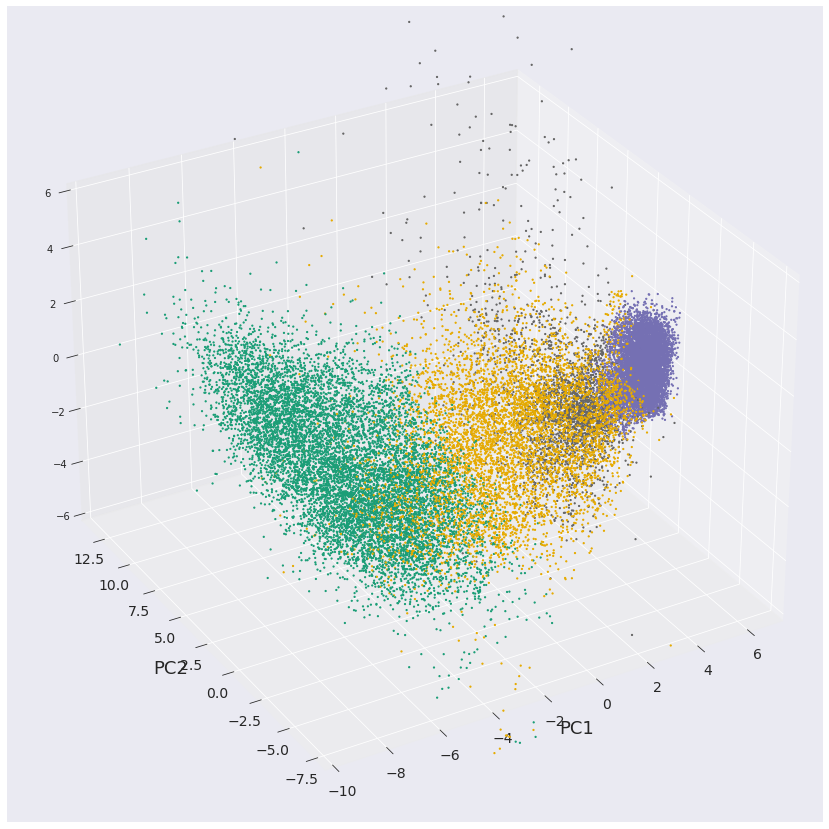

In [10]:
# plot 3D pca structure (now with class labels)
pt.plot_pca3D(ploc, colormap, dfp, Xtrans, frac=0.90, withLabels=True)

### Plot the vertical structure of the classes (temperature, salinity, and density in the top 1000m)

plot_tools.plot_class_vertical_structures
plot_tools.plot_many_profiles


/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/na

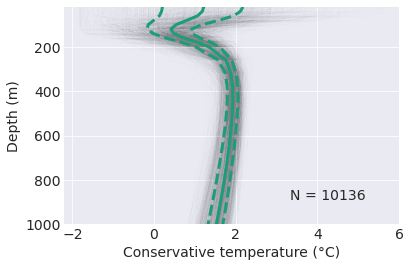

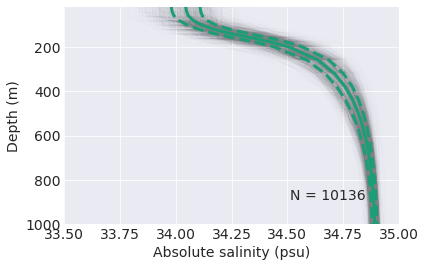

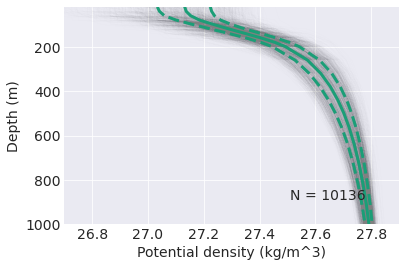

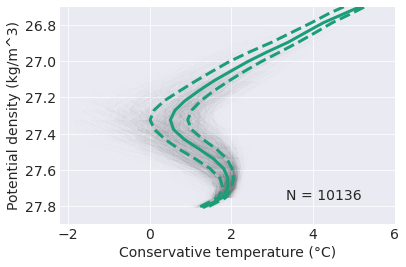

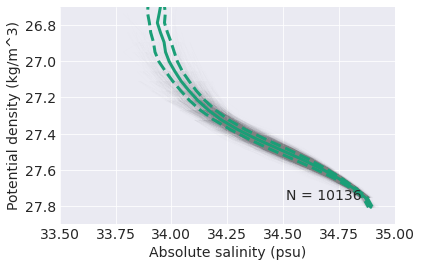

plot_tools.plot_many_profiles


/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/na

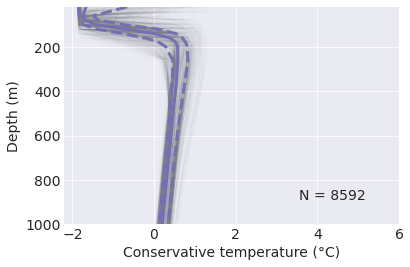

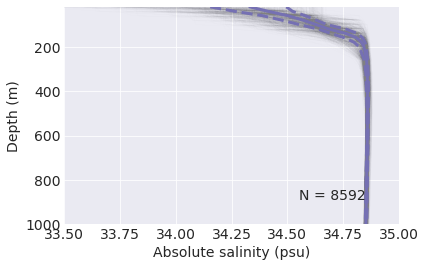

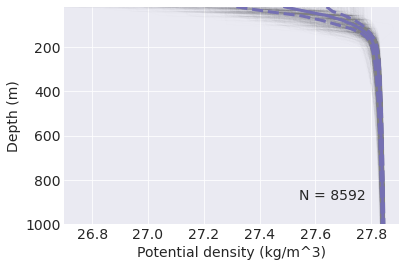

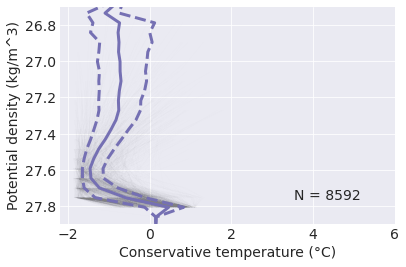

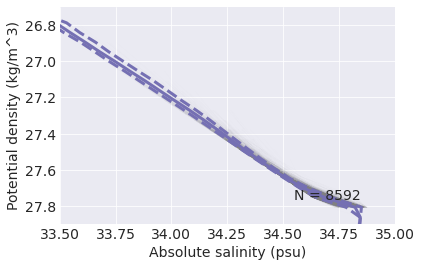

plot_tools.plot_many_profiles


/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/na

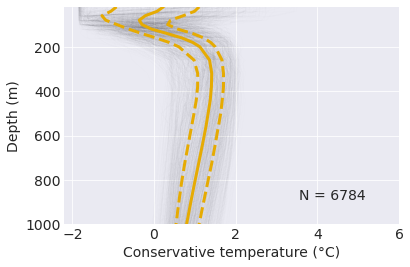

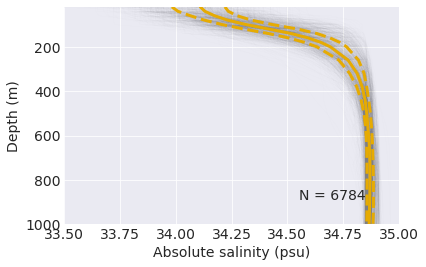

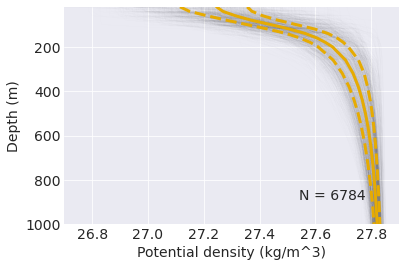

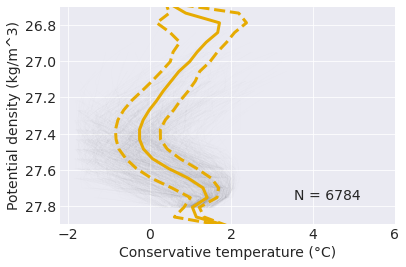

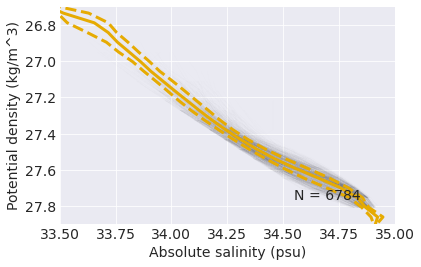

plot_tools.plot_many_profiles


/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/na

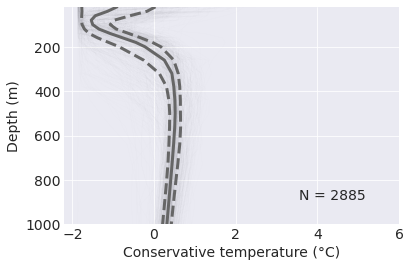

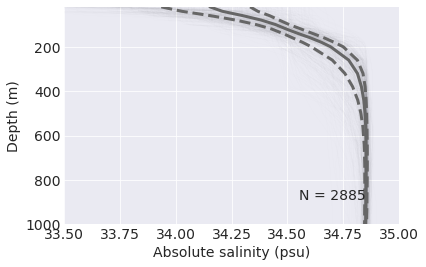

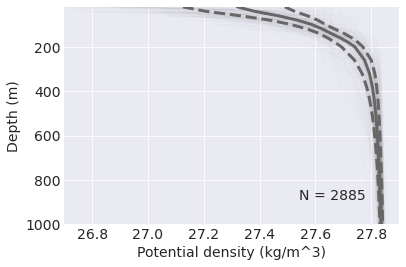

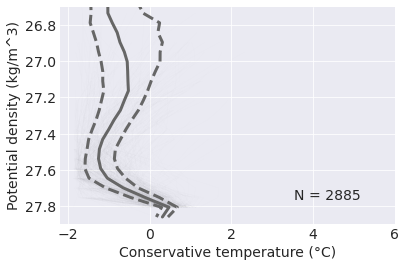

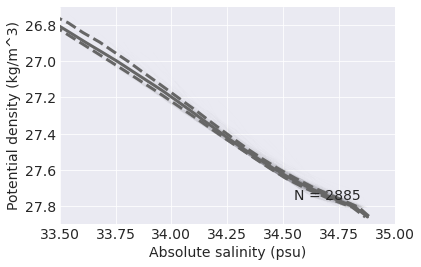

In [11]:
# plot T, S vertical structure of the classes
pt.plot_class_vertical_structures(ploc, profiles, n_components_selected, colormap,
                                  zmin=zmin, zmax=zmax,
                                  Tmin=Trange[0], Tmax=Trange[1],
                                  Smin=Srange[0], Smax=Srange[1],
                                  sig0min = 26.7, sig0max = 27.9,
                                  frac=0.18)

### Plot the vertical structure of the classes (temperature, salinity, and density in the top 400m)

plot_tools.plot_class_vertical_structures
plot_tools.plot_many_profiles


/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/na

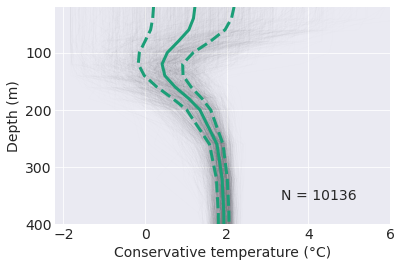

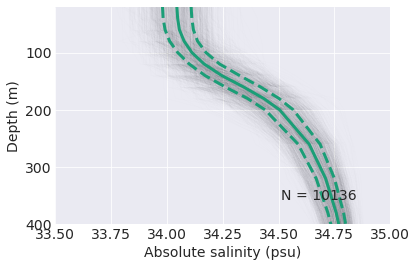

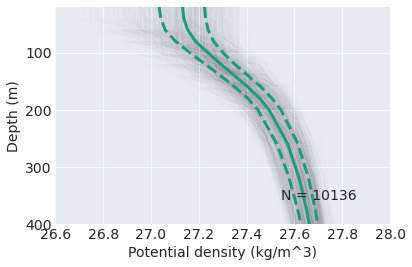

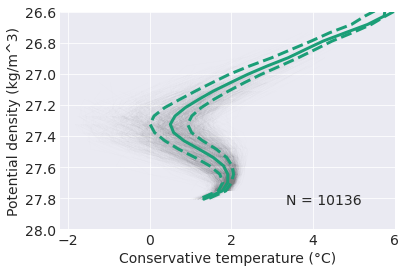

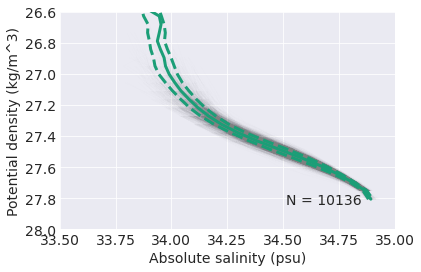

plot_tools.plot_many_profiles


/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/na

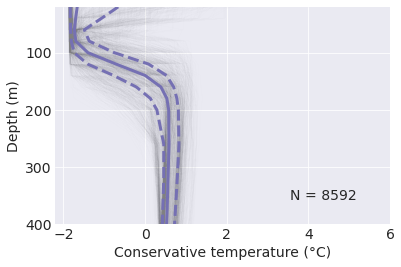

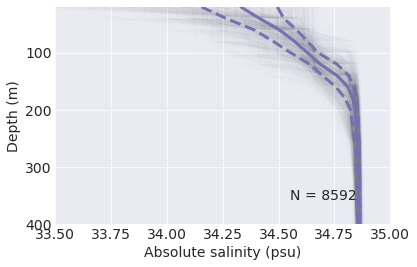

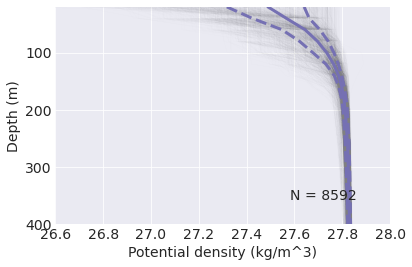

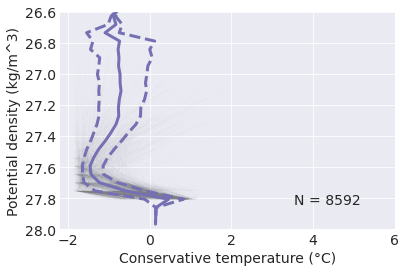

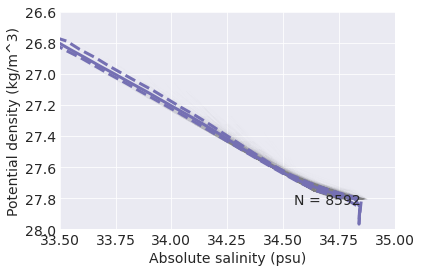

plot_tools.plot_many_profiles


/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/na

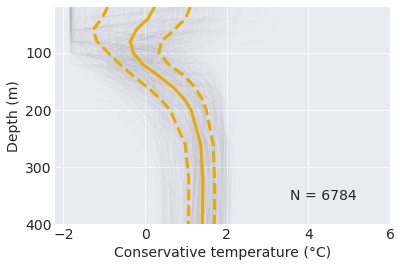

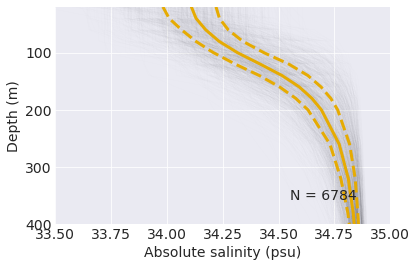

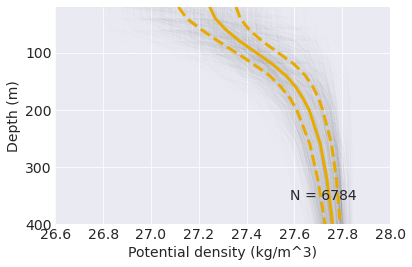

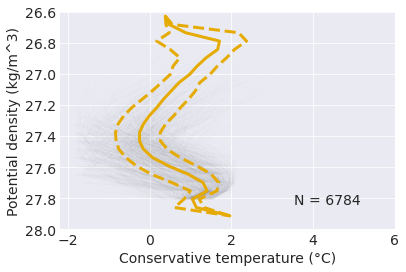

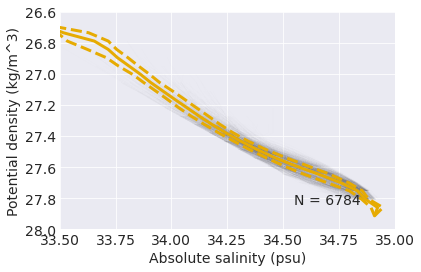

plot_tools.plot_many_profiles


/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1395: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/srv/conda/envs/notebook/lib/python3.9/site-packages/numpy/lib/na

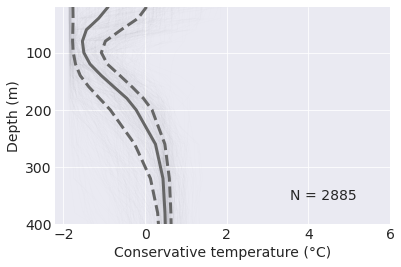

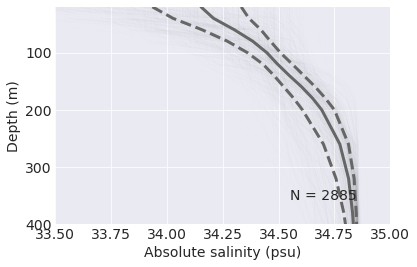

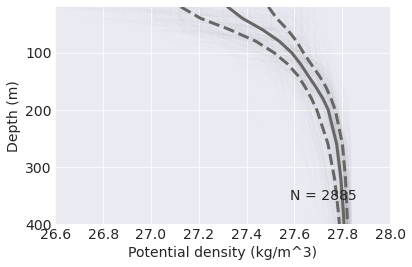

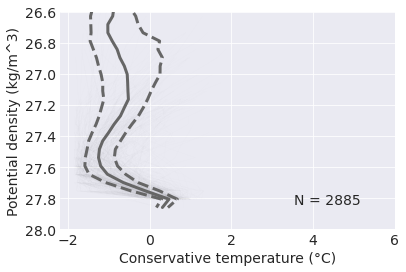

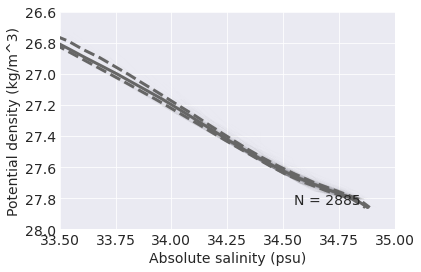

In [12]:
pt.plot_class_vertical_structures(ploc, profiles, n_components_selected, colormap,
                                  zmin=zmin, zmax=400,
                                  Tmin=Trange[0], Tmax=Trange[1],
                                  Smin=Srange[0], Smax=Srange[1],
                                  sig0min=sig0range[0], sig0max=sig0range[1],
                                  frac=0.18, description='top400m')

### Mean class properties in T-S space

plot_tools.plot_TS_withMeans


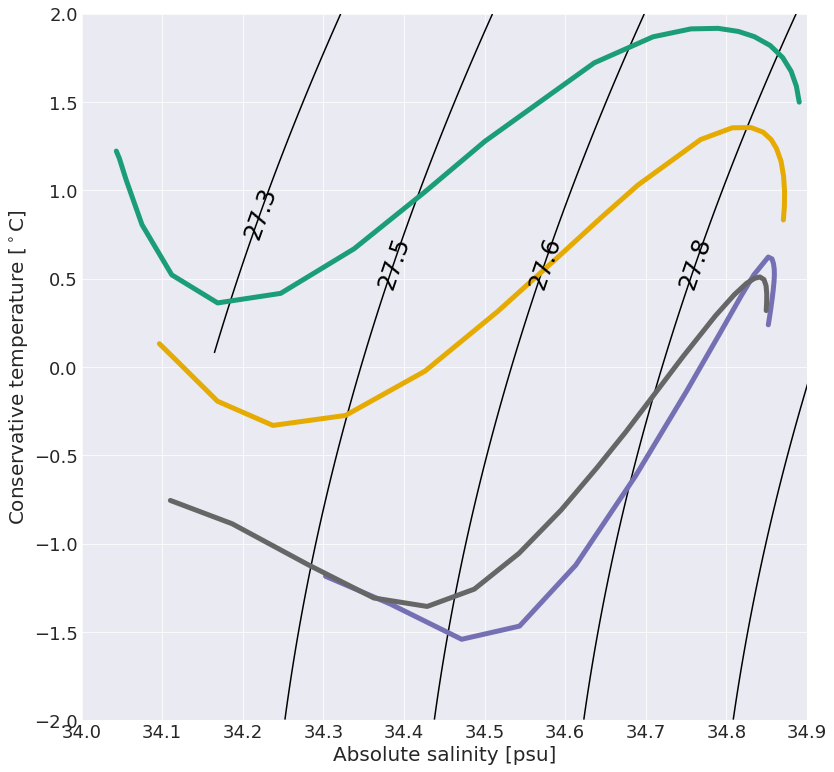

In [13]:
# TS diagram just showing the mean values
pt.plot_TS_withMeans(ploc, class_means, class_stds, n_components_selected, colormap,
                     PTrange=(-2, 2), SPrange=(34.0, 34.9))

### Class distribution by month 

plot_tools.plot_TS_bytime


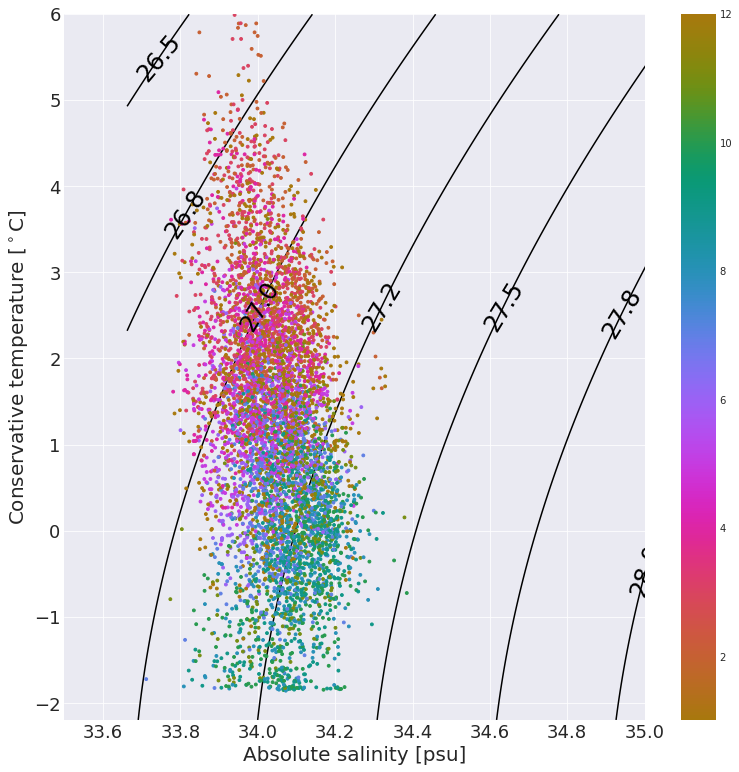

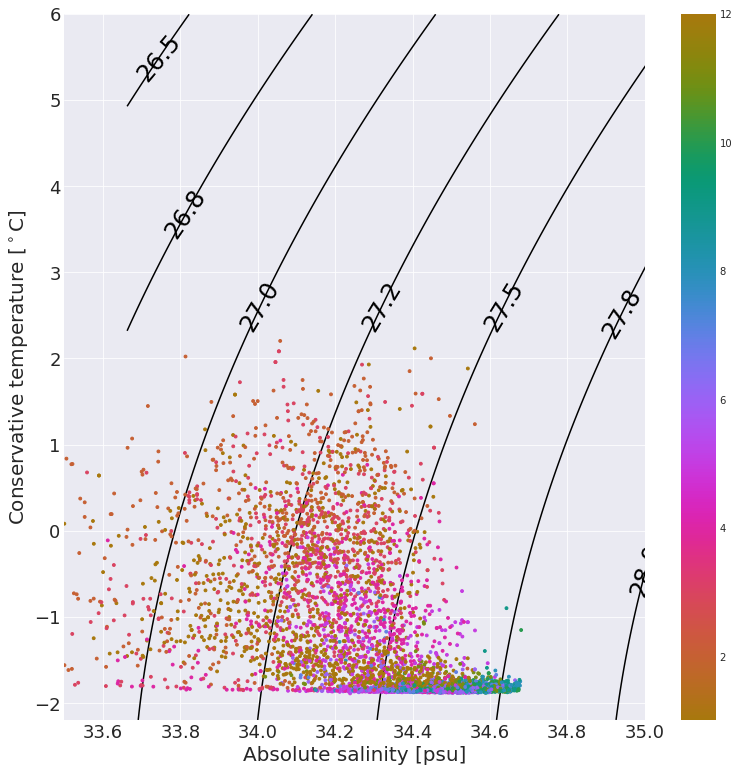

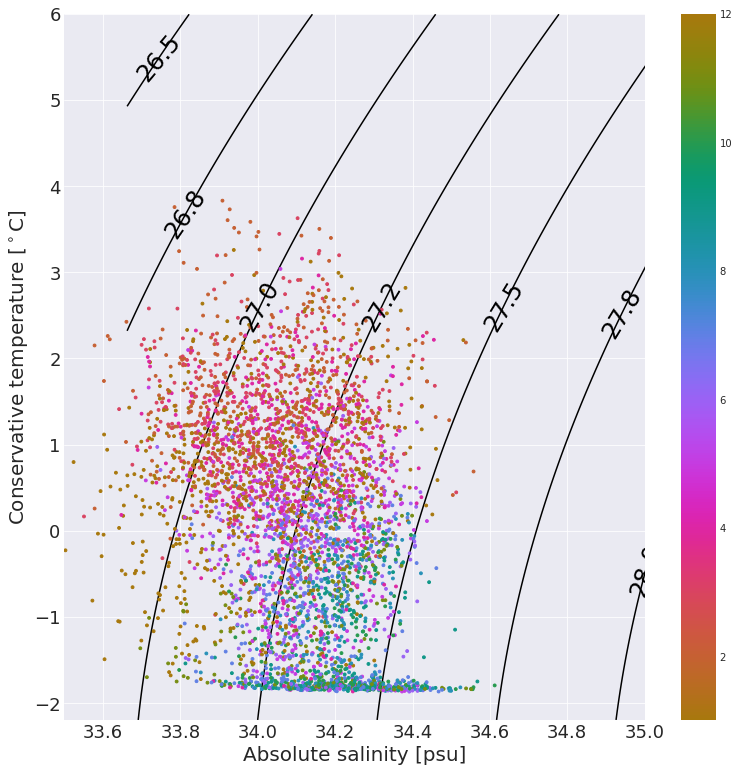

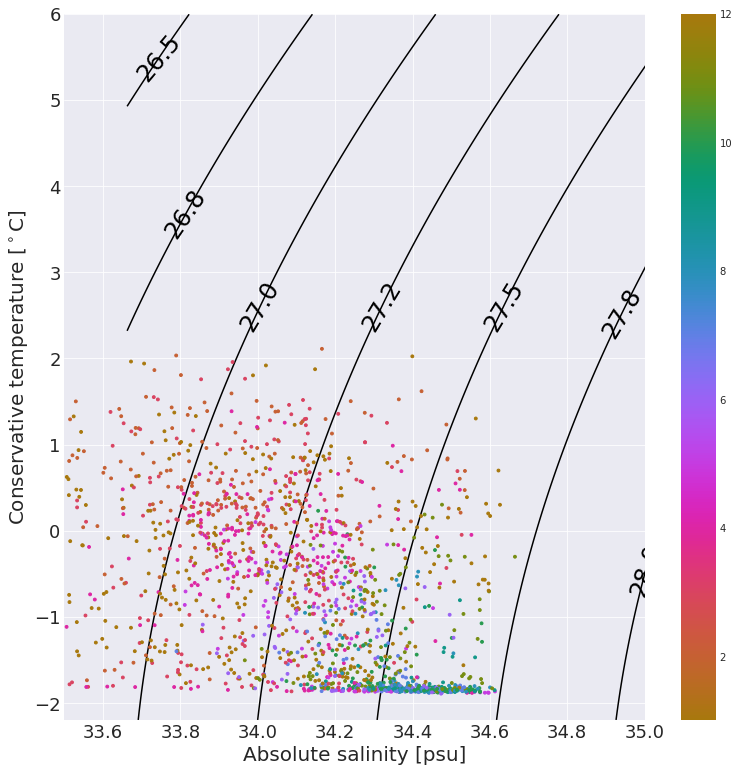

In [15]:
pt.plot_TS_bytime(ploc, dfp, n_components_selected,
                   descrip='', PTrange=Trange, SPrange=Srange,
                   lon = -20, lat = -65, rr = 0.60, timeShading='month')

### Calculate mixed layer depth, min/max values, and i-metric

In [16]:
# Calc and plot dynamic height, N2, mixed layer depth, etc.
dfp = density.calc_dynamic_height(dfp)
dfp = density.calc_Nsquared(dfp)
dfp = density.calc_mixed_layer_depth(dfp)

# Calc Tmin, Tmax, Smin, Smax
dfp['Tmin'] = dfp.prof_CT.min(dim='depth')
dfp['Tmax'] = dfp.prof_CT.max(dim='depth')
dfp['Smin'] = dfp.prof_SA.min(dim='depth')
dfp['Smax'] = dfp.prof_SA.max(dim='depth')
dfp['sig0min'] = dfp.sig0.min(dim='depth')
dfp['sig0max'] = dfp.sig0.max(dim='depth')

# i-metric calculation
dfp['imetric'] = gmm.calc_i_metric(profiles).i_metric

# select the top pressure level for plotting purposes
df1D = dfp.isel(depth=0)

density.calc_dynamic_height
density.calc_Nsquared
density.calc_mixed_layer depth
NOTE: must call density.calc_Nsquared first
gmm.calc_i_metric


### Mixed layer depth 

class = 0
min / Q25 / Q50 / Q75 / max
110.13 / 165.62 / 188.26 / 213.11 / 416.75
class = 1
min / Q25 / Q50 / Q75 / max
26.06 / 75.49 / 103.20 / 137.96 / 288.47
class = 2
min / Q25 / Q50 / Q75 / max
44.36 / 121.93 / 142.73 / 165.86 / 349.35
class = 3
min / Q25 / Q50 / Q75 / max
38.89 / 92.95 / 118.20 / 162.61 / 490.35
plot_tools.plot_hist_map
file_io.load_bathymetry


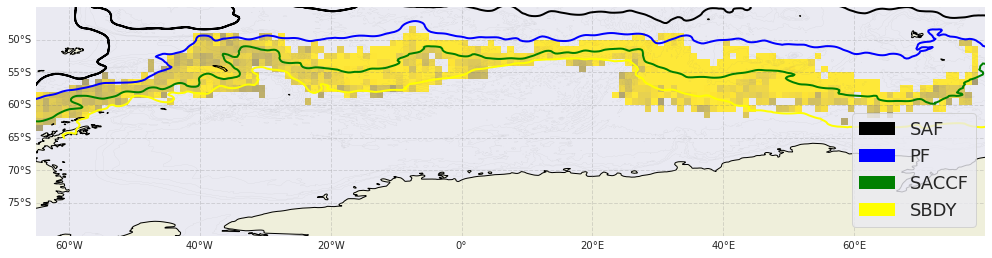

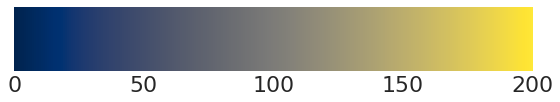

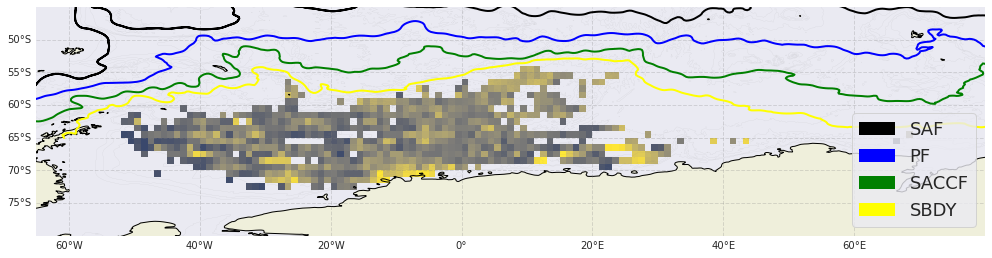

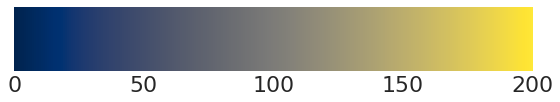

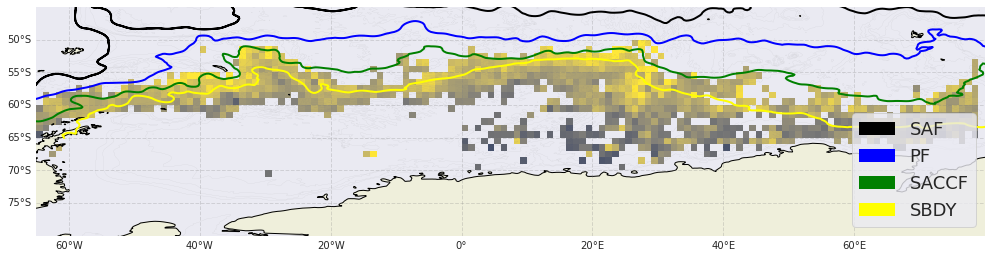

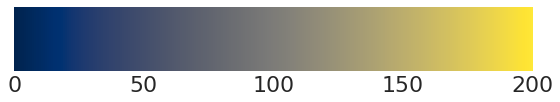

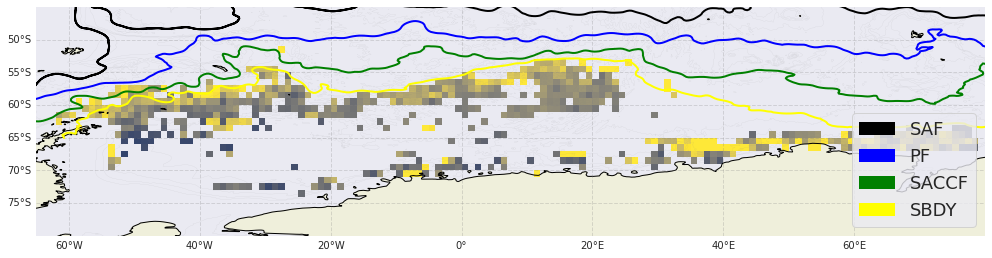

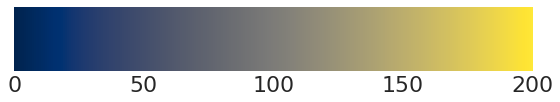

In [17]:
# print mld stats
density.calc_oneLevel_stats(ploc, dfp, n_components_selected)

# histogram map (mixed layer depth)
pt.plot_hist_map(ploc, dfp, lon_range, lat_range,
                 n_components_selected,
                 c_range=(0,200),
                 vartype='mld',
                 colormap=plt.get_cmap('cividis'))

### Dynamic height

plot_tools.plot_dynamic_height_maps
----- Dynamic height: 20 dbar -----
plot_tools.plot_hist_map
file_io.load_bathymetry


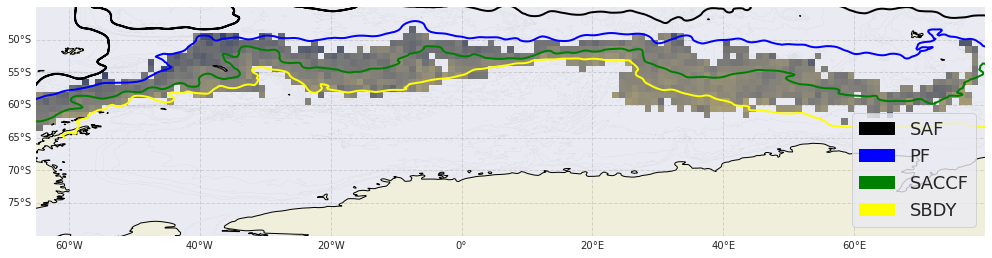

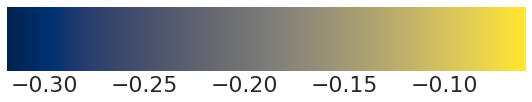

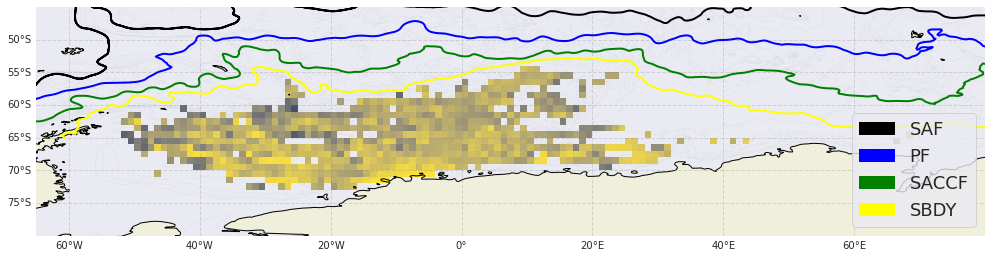

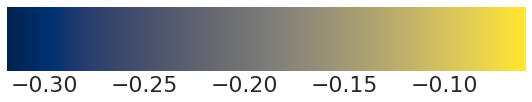

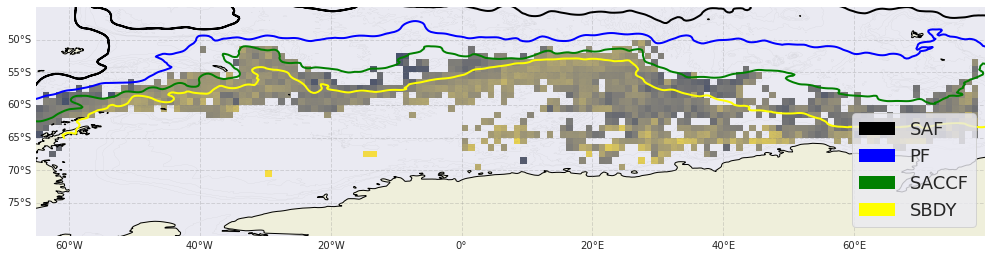

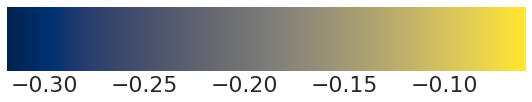

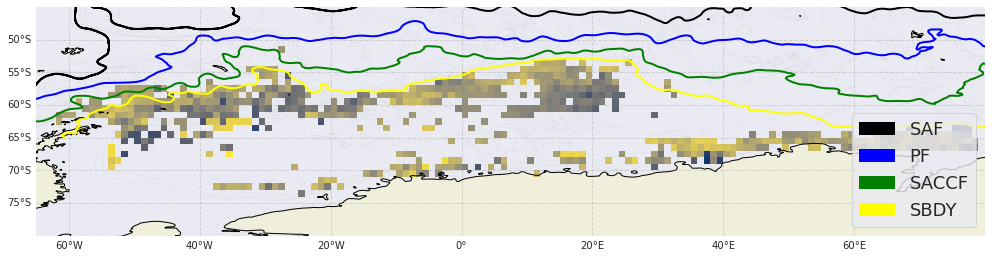

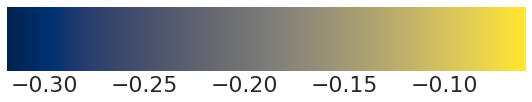

----- Dynamic height: 100 dbar -----
plot_tools.plot_hist_map
file_io.load_bathymetry


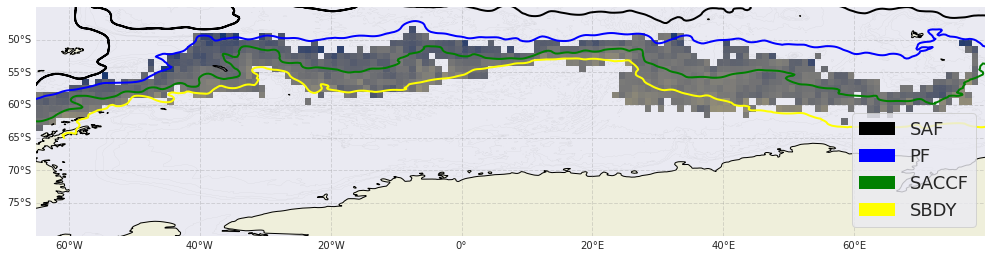

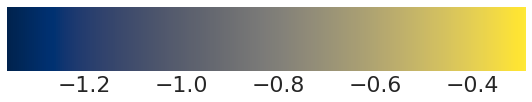

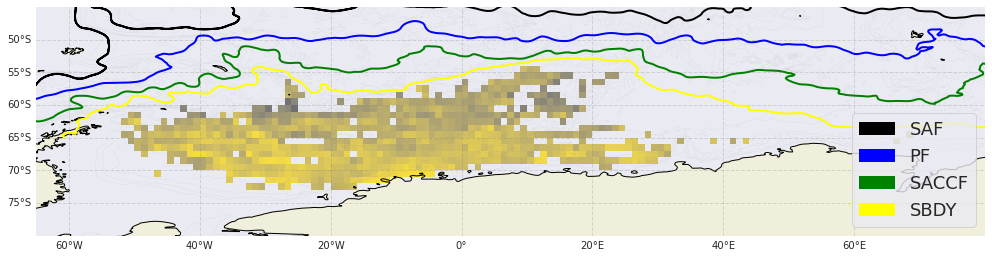

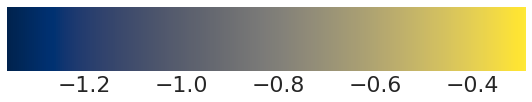

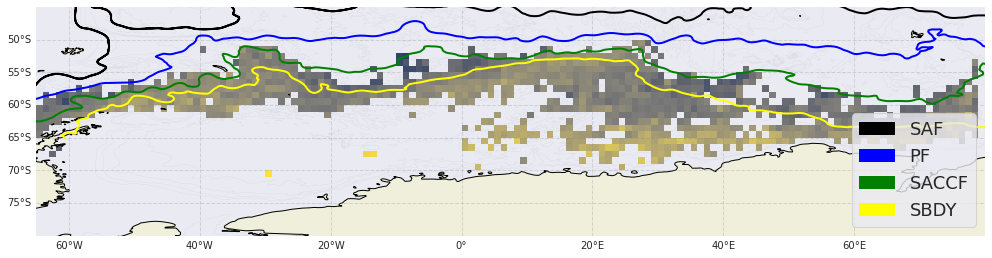

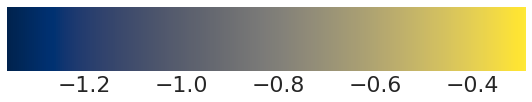

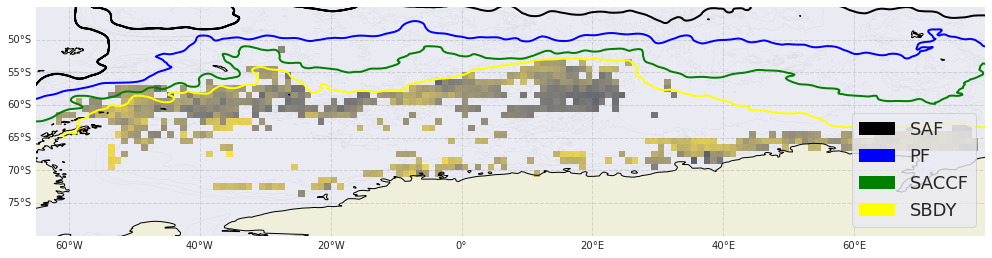

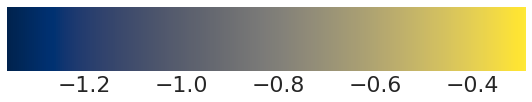

----- Dynamic height: 500 dbar -----
plot_tools.plot_hist_map
file_io.load_bathymetry


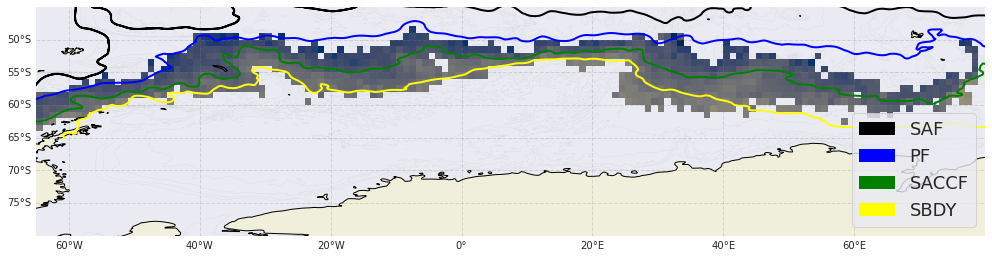

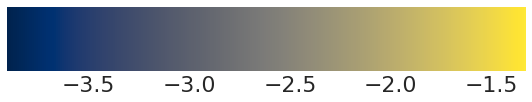

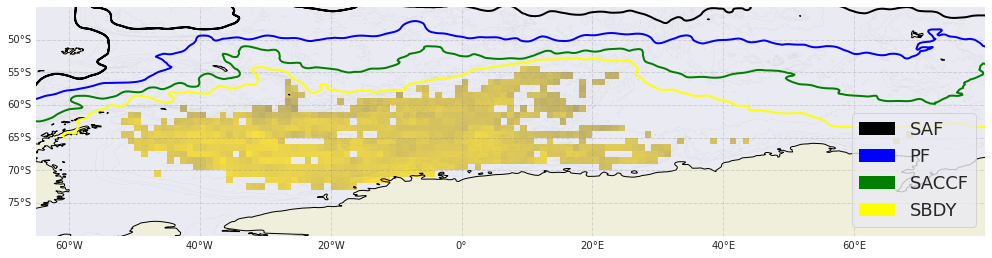

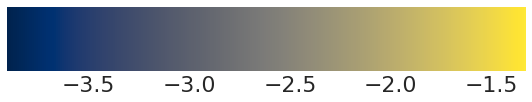

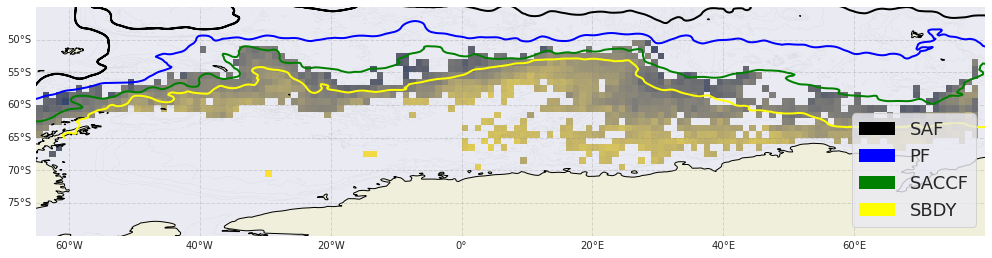

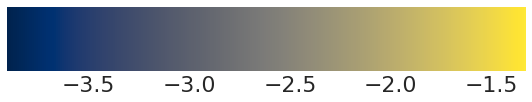

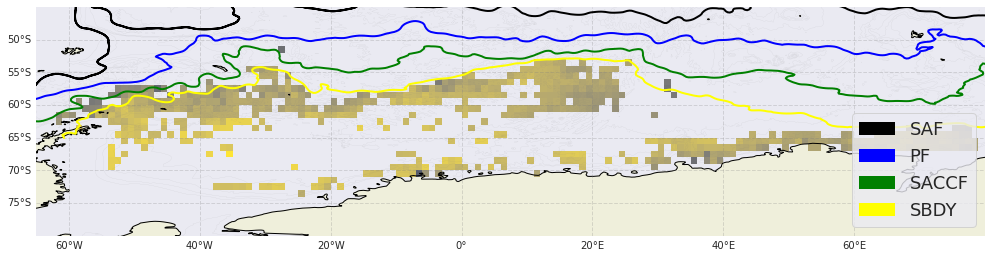

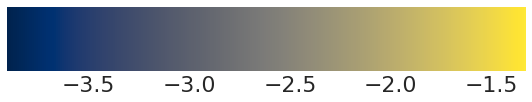

----- Dynamic height: 1000 dbar -----
plot_tools.plot_hist_map
file_io.load_bathymetry


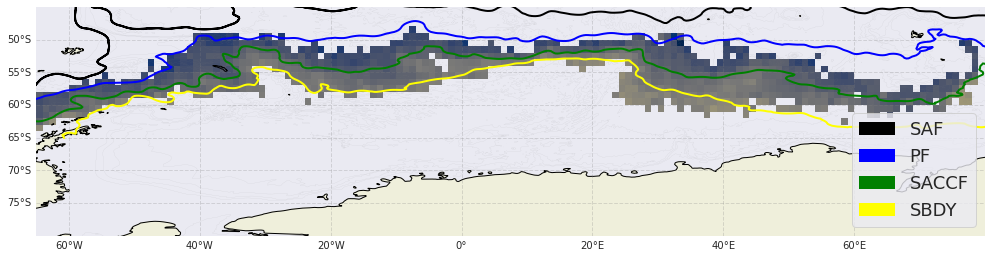

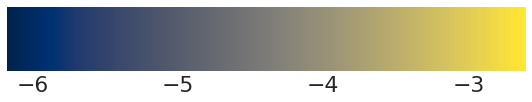

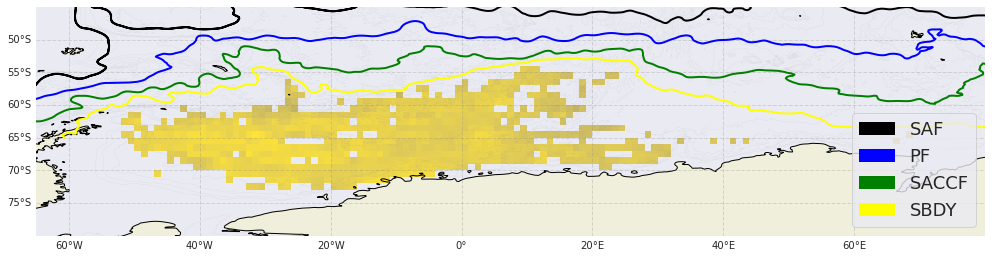

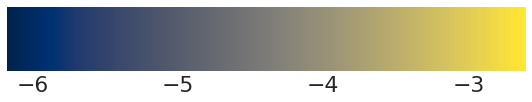

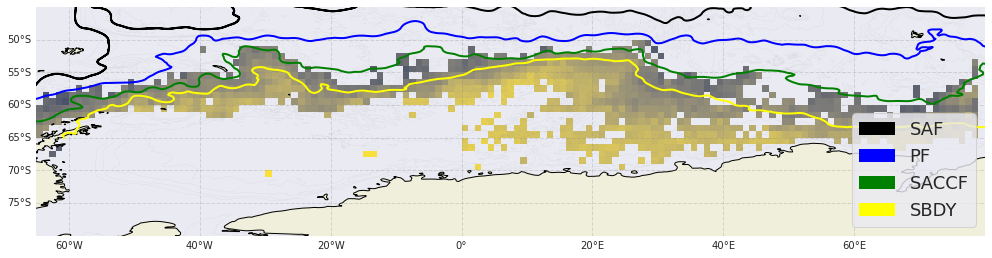

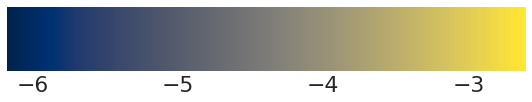

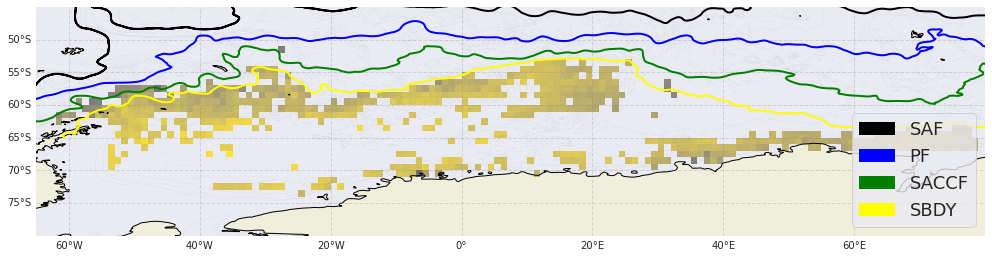

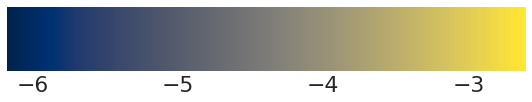

In [18]:
# plot maps of dynamic height
pt.plot_dynamic_height_maps(ploc, dfp, lon_range, lat_range, n_components_selected)

### imetric

class = 0
min / Q25 / Q50 / Q75 / max
0.00 / 0.00 / 0.03 / 0.18 / 1.00
class = 1
min / Q25 / Q50 / Q75 / max
0.00 / 0.00 / 0.00 / 0.02 / 1.00
class = 2
min / Q25 / Q50 / Q75 / max
0.00 / 0.00 / 0.07 / 0.38 / 1.00
class = 3
min / Q25 / Q50 / Q75 / max
0.00 / 0.00 / 0.08 / 0.48 / 1.00
plot_tools.plot_hist_map
file_io.load_bathymetry


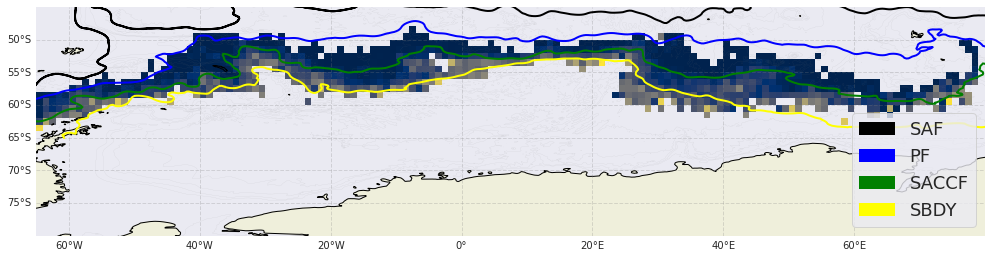

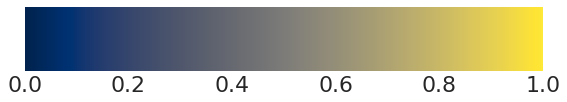

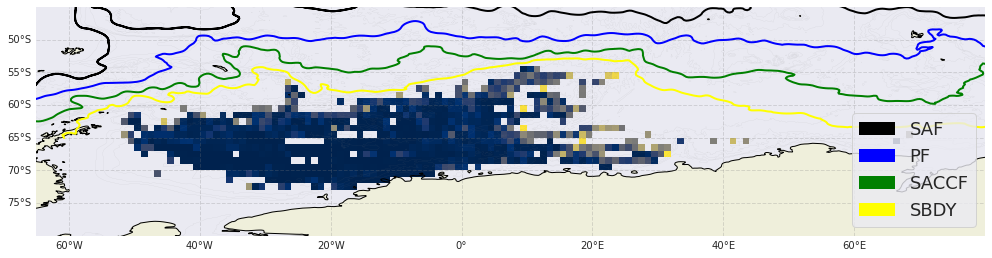

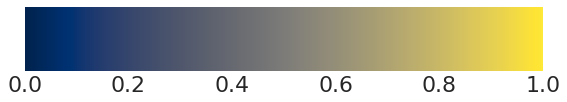

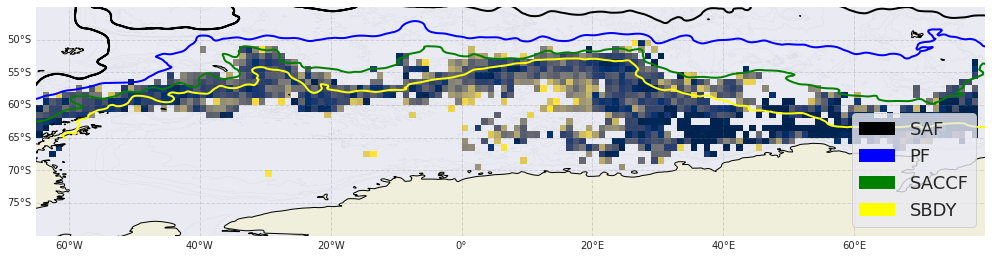

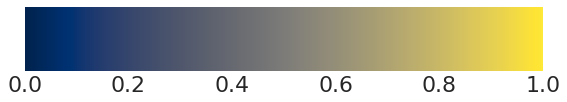

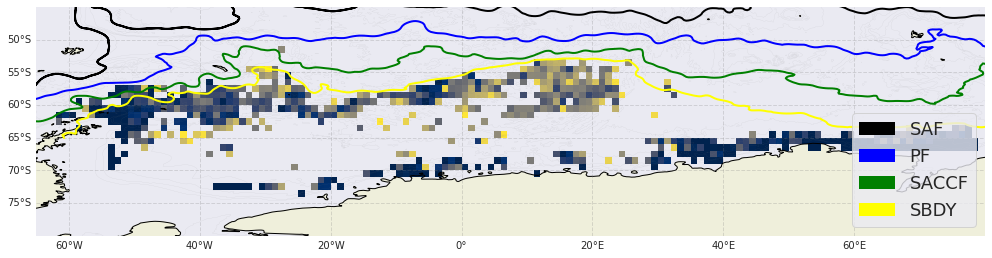

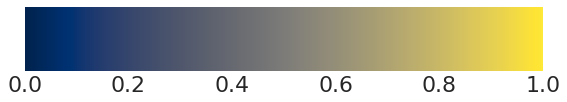

In [19]:
# print mld stats
density.calc_oneLevel_stats(ploc, dfp, n_components_selected, 'imetric')

# histogram map (imetric)
pt.plot_hist_map(ploc, df1D, lon_range, lat_range,
                 n_components_selected,
                 c_range=(0,1),
                 vartype='imetric',
                 colormap=plt.get_cmap('cividis'))

### Volume histograms 

plot_tools.calc_and_plot_volume_histogram_TS


/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/core/computation.py:733: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


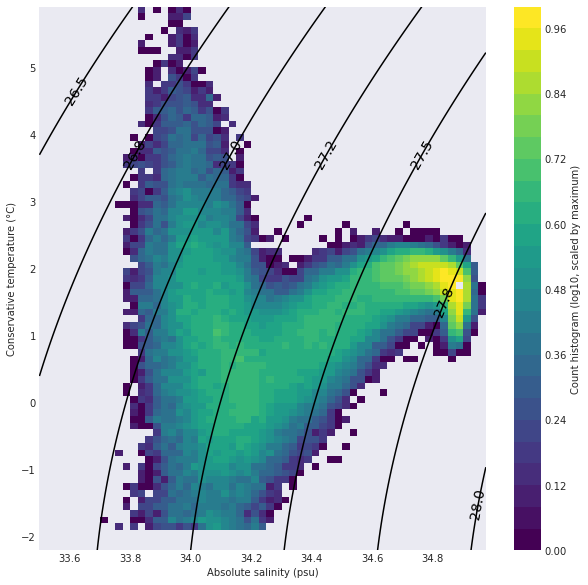

plot_tools.calc_and_plot_volume_histogram_TS


/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/core/computation.py:733: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


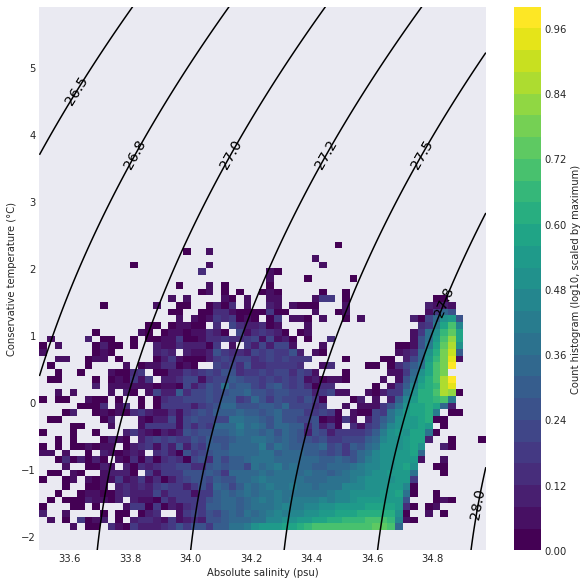

plot_tools.calc_and_plot_volume_histogram_TS


/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/core/computation.py:733: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


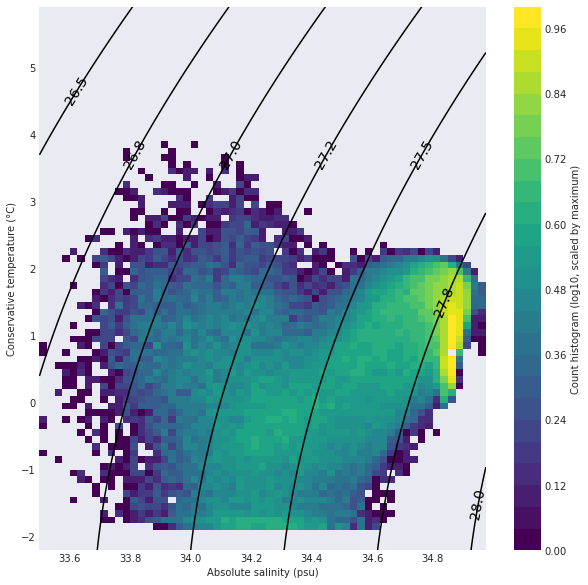

plot_tools.calc_and_plot_volume_histogram_TS


/srv/conda/envs/notebook/lib/python3.9/site-packages/xarray/core/computation.py:733: RuntimeWarning: divide by zero encountered in log10
  result_data = func(*input_data)


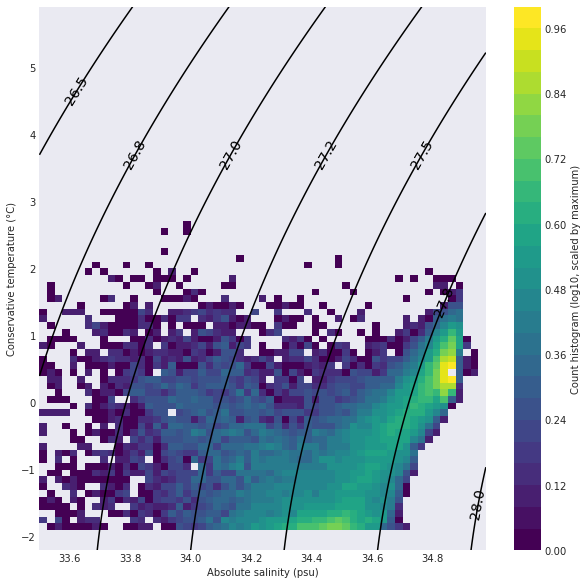

In [20]:
# some T-S histograms
sbins = np.arange(Srange[0], Srange[1], 0.025)
tbins = np.arange(Trange[0], Trange[1], 0.1)
df_select = dfp.where(dfp.label==0, drop=True)
histTS_class1 = pt.calc_and_plot_volume_histogram_TS(ploc, df_select, sbins=sbins, tbins=tbins, modStr='class1')
df_select = dfp.where(dfp.label==1, drop=True)
histTS_class2 = pt.calc_and_plot_volume_histogram_TS(ploc, df_select, sbins=sbins, tbins=tbins, modStr='class2')
df_select = dfp.where(dfp.label==2, drop=True)
histTS_class3 = pt.calc_and_plot_volume_histogram_TS(ploc, df_select, sbins=sbins, tbins=tbins, modStr='class3')
df_select = dfp.where(dfp.label==3, drop=True)
histTS_class4 = pt.calc_and_plot_volume_histogram_TS(ploc, df_select, sbins=sbins, tbins=tbins, modStr='class4')

### Maximum temperature 

class = 0
min / Q25 / Q50 / Q75 / max
1.30 / 1.87 / 2.04 / 2.26 / 6.97
class = 1
min / Q25 / Q50 / Q75 / max
0.18 / 0.50 / 0.67 / 0.88 / 2.33
class = 2
min / Q25 / Q50 / Q75 / max
0.34 / 1.27 / 1.56 / 1.84 / 3.83
class = 3
min / Q25 / Q50 / Q75 / max
-1.71 / 0.50 / 0.64 / 0.84 / 2.69
plot_tools.plot_hist_map
file_io.load_bathymetry


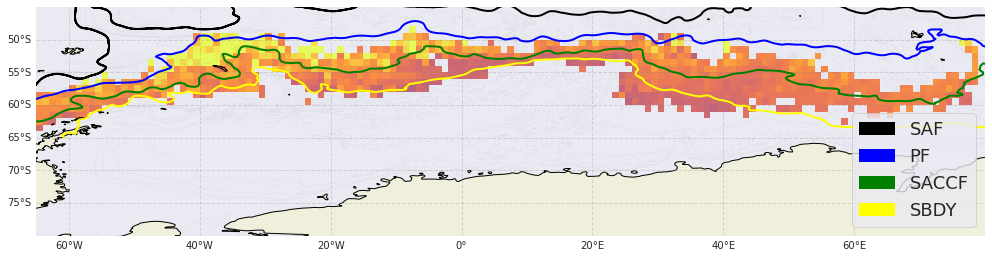

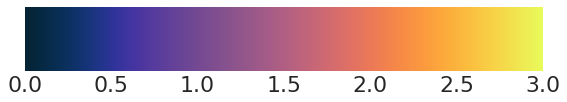

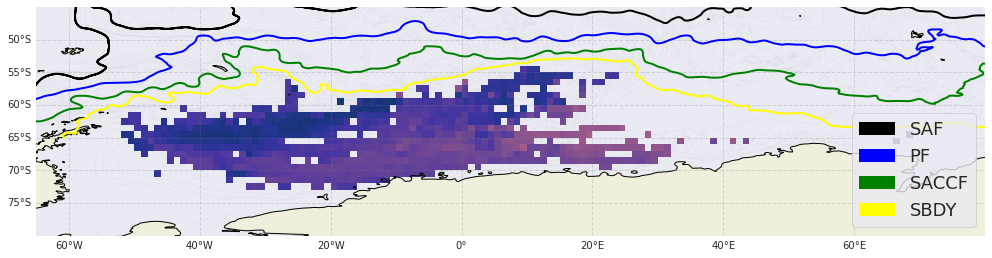

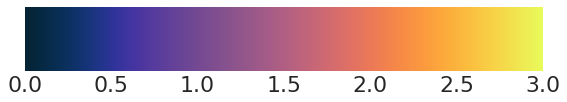

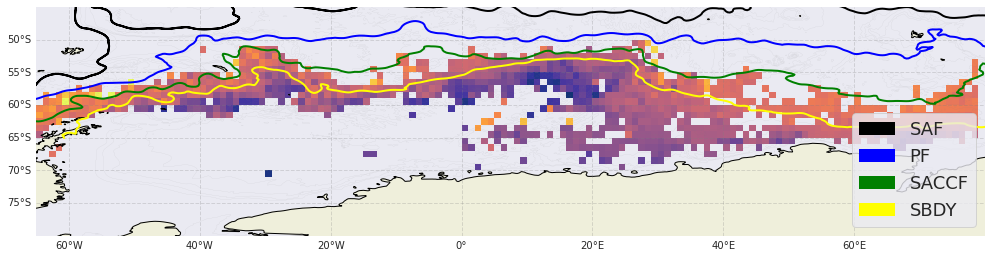

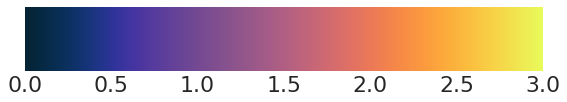

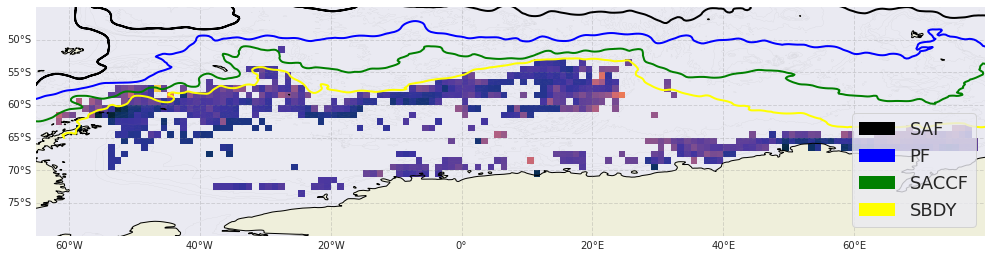

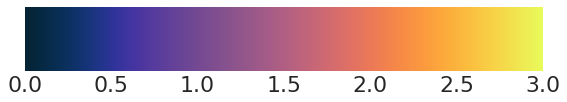

In [21]:
# print stats
density.calc_oneLevel_stats(ploc, dfp, n_components_selected, 'Tmax')

# histogram map (Tmax)
pt.plot_hist_map(ploc, df1D, lon_range, lat_range,
                 n_components_selected,
                 c_range=(0,3),
                 vartype='Tmax',
                 colormap=cmocean.cm.thermal)

### Minimum temperature

class = 0
min / Q25 / Q50 / Q75 / max
-1.87 / -0.32 / 0.22 / 0.68 / 1.89
class = 1
min / Q25 / Q50 / Q75 / max
-1.90 / -1.84 / -1.78 / -1.64 / 0.09
class = 2
min / Q25 / Q50 / Q75 / max
-1.87 / -1.48 / -0.80 / -0.22 / 1.50
class = 3
min / Q25 / Q50 / Q75 / max
-1.89 / -1.81 / -1.66 / -1.24 / 0.32
plot_tools.plot_hist_map
file_io.load_bathymetry


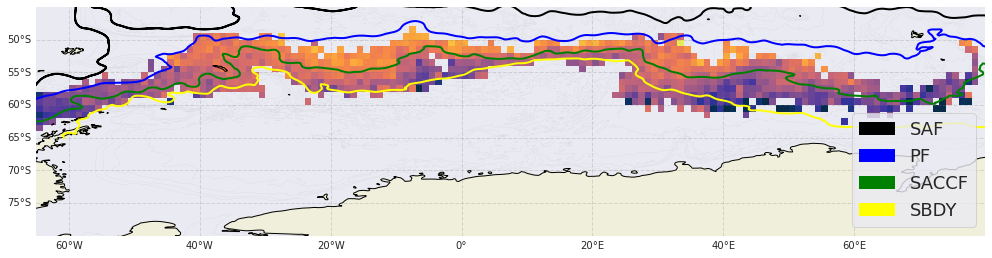

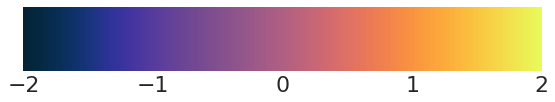

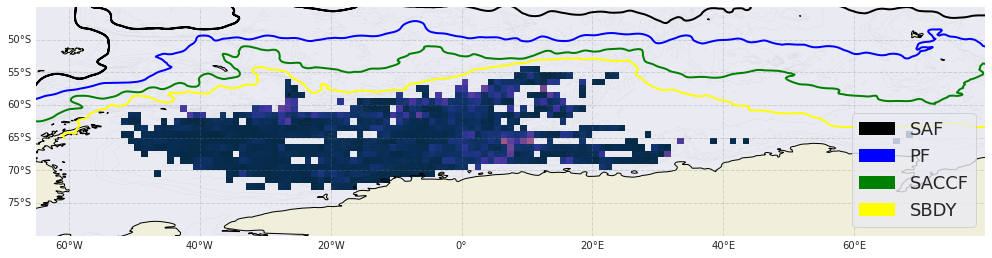

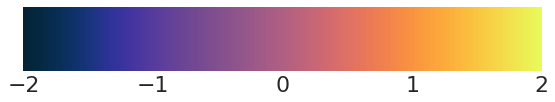

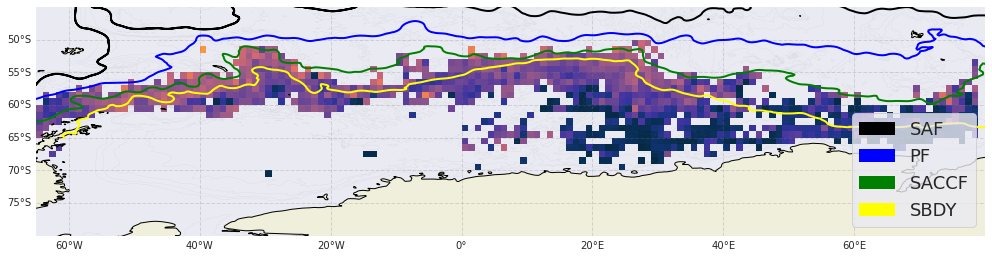

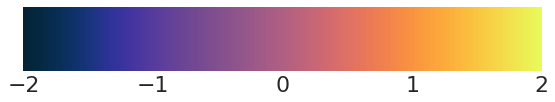

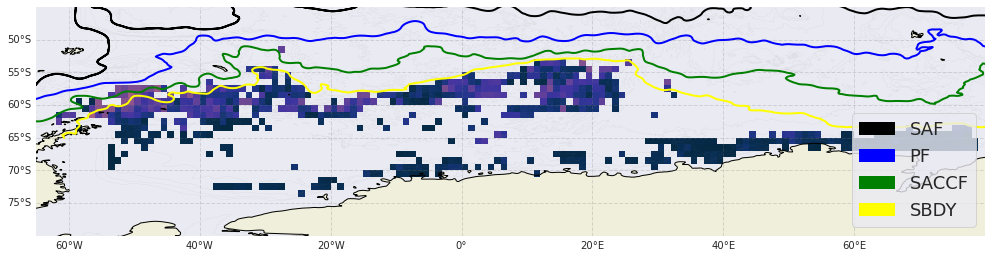

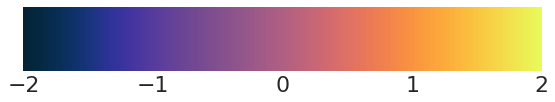

In [22]:
# print stats
density.calc_oneLevel_stats(ploc, dfp, n_components_selected, 'Tmin')

# histogram map (Tmax)
pt.plot_hist_map(ploc, df1D, lon_range, lat_range,
                 n_components_selected,
                 c_range=(-2,2),
                 vartype='Tmin',
                 colormap=cmocean.cm.thermal)

### Minimum salinity

class = 0
min / Q25 / Q50 / Q75 / max
33.71 / 33.98 / 34.04 / 34.11 / 34.43
class = 1
min / Q25 / Q50 / Q75 / max
33.15 / 34.15 / 34.33 / 34.49 / 34.68
class = 2
min / Q25 / Q50 / Q75 / max
33.30 / 33.98 / 34.11 / 34.22 / 34.61
class = 3
min / Q25 / Q50 / Q75 / max
32.99 / 33.93 / 34.15 / 34.33 / 34.67
plot_tools.plot_hist_map
file_io.load_bathymetry


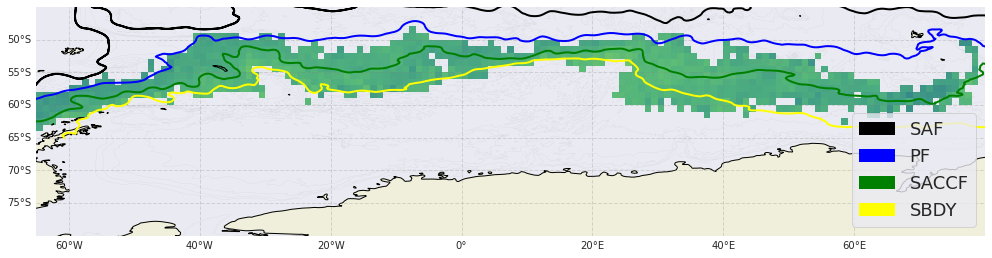

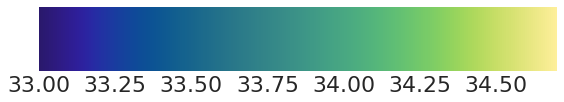

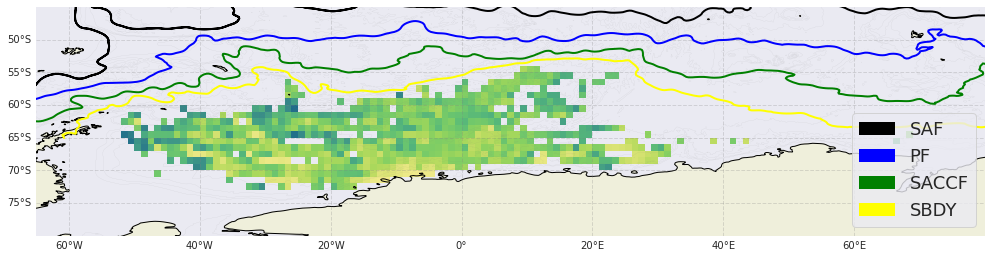

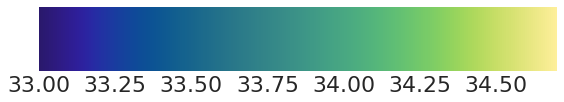

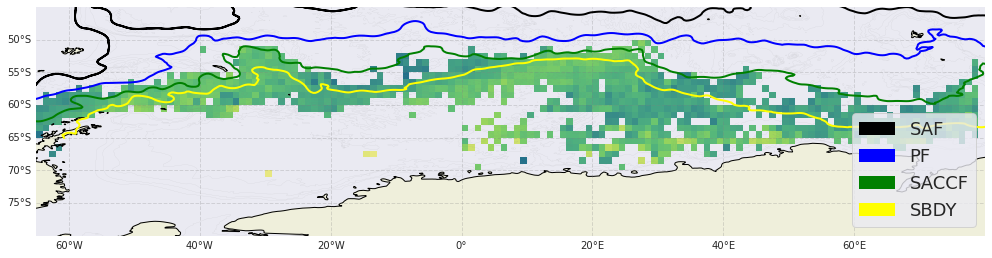

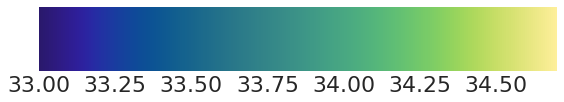

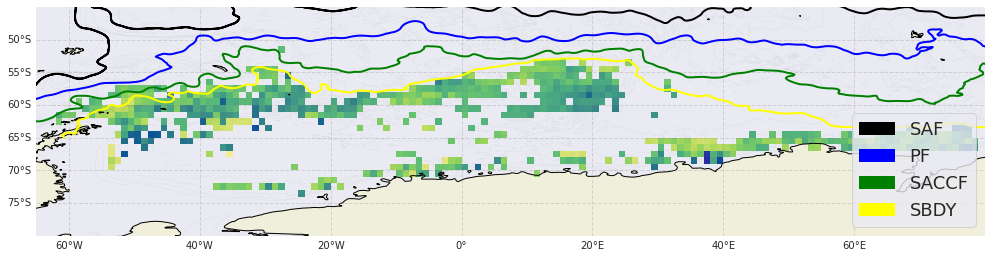

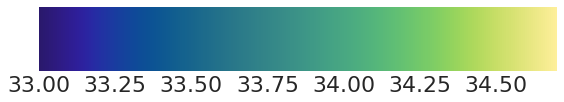

In [23]:
# print stats
density.calc_oneLevel_stats(ploc, dfp, n_components_selected, 'Smin')

# histogram map (Tmax)
pt.plot_hist_map(ploc, df1D, lon_range, lat_range,
                 n_components_selected,
                 c_range=(33.0, 34.7),
                 vartype='Smin',
                 colormap=cmocean.cm.haline)

## tSNE alternative plots

### Tmax

/srv/conda/envs/notebook/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


plot_tools.plot_tsne


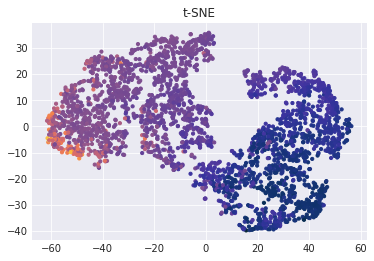

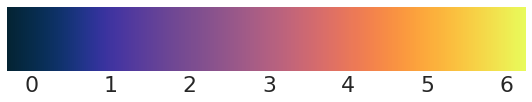

In [24]:
myVar = "Tmax"
tSNE_data, colors_for_tSNE = lp.fit_and_apply_tsne(df1D, Xtrans, var_to_plot=myVar)
pt.plot_tsne("tests/", cmocean.cm.thermal, tSNE_data, colors_for_tSNE, describe=myVar)

### Dynamic height

/srv/conda/envs/notebook/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


plot_tools.plot_tsne


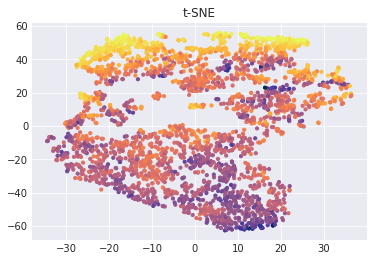

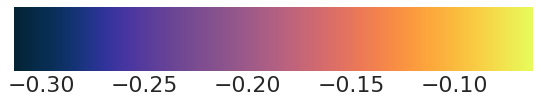

In [25]:
myVar = "dyn_height"
tSNE_data, colors_for_tSNE = lp.fit_and_apply_tsne(df1D, Xtrans, var_to_plot=myVar)
pt.plot_tsne("tests/", cmocean.cm.thermal, tSNE_data, colors_for_tSNE, describe=myVar)

### MLD

/srv/conda/envs/notebook/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


plot_tools.plot_tsne


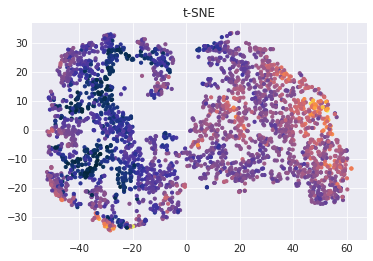

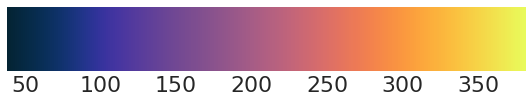

In [26]:
myVar = "mld"
tSNE_data, colors_for_tSNE = lp.fit_and_apply_tsne(df1D, Xtrans, var_to_plot=myVar)
pt.plot_tsne("tests/", cmocean.cm.thermal, tSNE_data, colors_for_tSNE, describe=myVar)

### imetric

/srv/conda/envs/notebook/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


plot_tools.plot_tsne


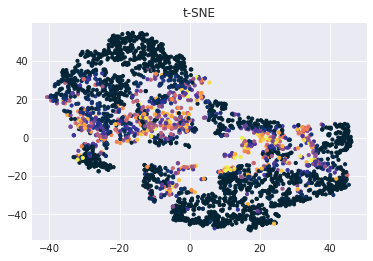

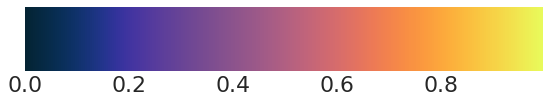

In [27]:
myVar = "imetric"
tSNE_data, colors_for_tSNE = lp.fit_and_apply_tsne(df1D, Xtrans, var_to_plot=myVar)
pt.plot_tsne("tests/", cmocean.cm.thermal, tSNE_data, colors_for_tSNE, describe=myVar)

# Some seasonal plots

In [83]:
dfp

<xarray.Dataset>
Dimensions:        (profile: 28397, depth: 21, CLASS: 4, depth_mid: 20)
Coordinates:
  * profile        (profile) int64 13 14 15 16 ... 142282 142301 142320 142330
    lon            (profile) float64 -26.44 -22.37 -17.38 ... 53.09 53.33 53.76
    lat            (profile) float64 -55.98 -56.81 -57.51 ... -58.46 -58.59
  * depth          (depth) float64 20.0 40.0 60.0 80.0 ... 820.0 910.0 1e+03
    time           (profile) datetime64[ns] 1973-01-11T12:00:00 ... 2020-10-1...
    year           (profile) int64 1973 1973 1973 1973 ... 2020 2020 2020 2020
    month          (profile) int64 1 1 1 1 1 1 1 1 1 1 ... 8 8 8 9 9 9 9 9 10 10
  * CLASS          (CLASS) int64 0 1 2 3
  * depth_mid      (depth_mid) float64 30.0 50.0 70.0 90.0 ... 775.0 865.0 955.0
Data variables: (12/18)
    prof_date      (profile) float64 7.206e+05 7.206e+05 ... 7.381e+05 7.381e+05
    prof_YYYYMMDD  (profile) float64 1.973e+07 1.973e+07 ... 2.02e+07 2.02e+07
    prof_HHMMSS    (profile) float64 1.2e+05 1.2e+05 ... 4.45e+04 5.19e+04
    sig0           (profile, depth) float64 26.84 27.07 27.39 ... 27.8 27.8
    prof_SA        (profile, depth) float64 33.58 33.82 34.19 ... 34.9 34.9 34.9
    prof_CT        (profile, depth) float64 -0.1931 -0.8729 ... 1.535 1.466
    ...             ...
    Tmax           (profile) float64 0.7265 1.285 1.719 ... 1.955 1.906 1.905
    Smin           (profile) float64 33.58 33.7 33.92 ... 34.12 34.06 34.04
    Smax           (profile) float64 34.84 34.88 34.88 34.89 ... 34.9 34.9 34.9
    sig0min        (profile) float64 26.84 26.85 27.02 ... 27.32 27.29 27.27
    sig0max        (profile) float64 27.83 27.82 27.8 27.81 ... 27.8 27.8 27.8
    imetric        (profile) float64 0.005083 0.003432 0.5349 ... 0.284 0.1289

plot_tools.plot_hist_map


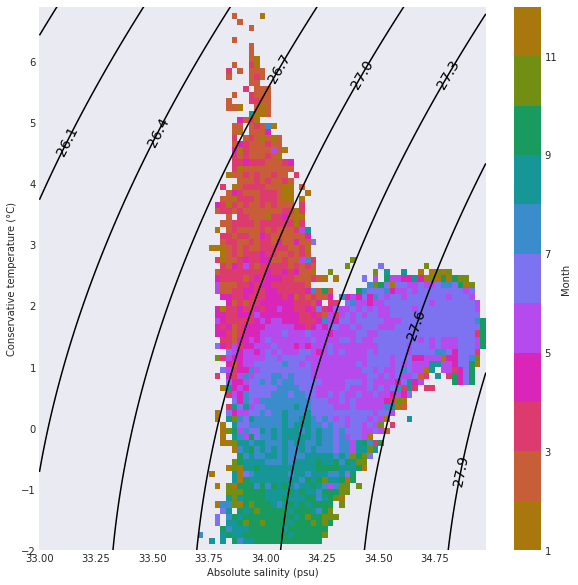

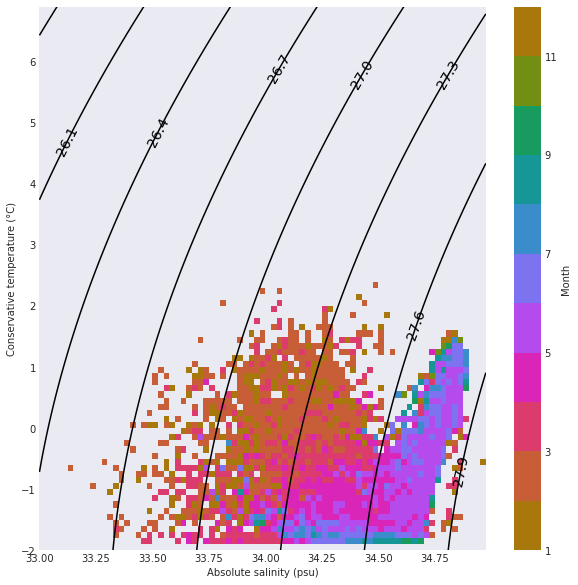

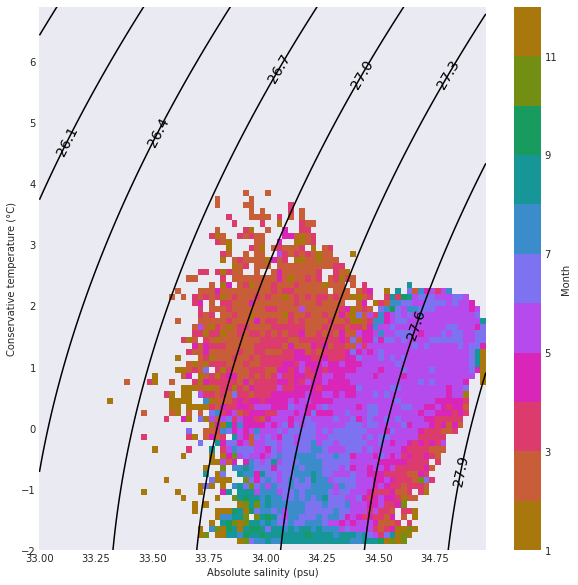

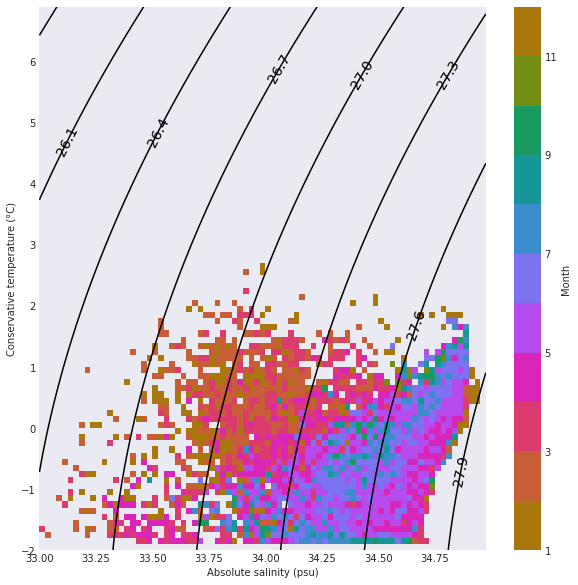

In [186]:
pt.plot_hist_TS(ploc, dfp, n_components_selected,
                sbins = np.arange(33, 35, 0.025), 
                tbins = np.arange(-2, 7, 0.1),
                vartype='month',
                colormap=cmocean.cm.phase)

plot_tools.plot_hist_map


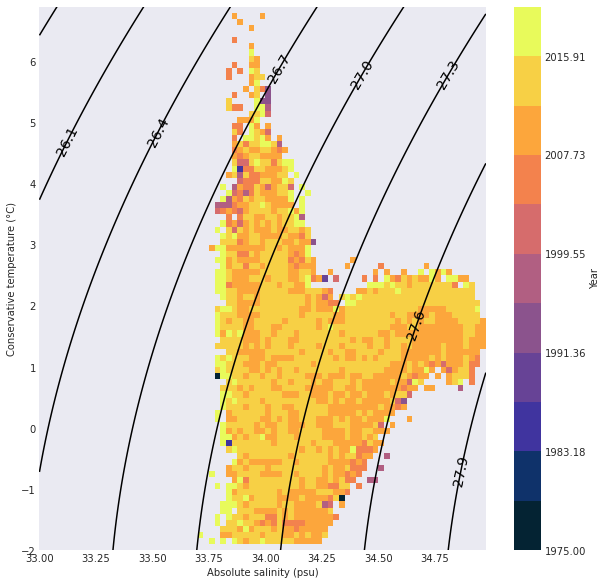

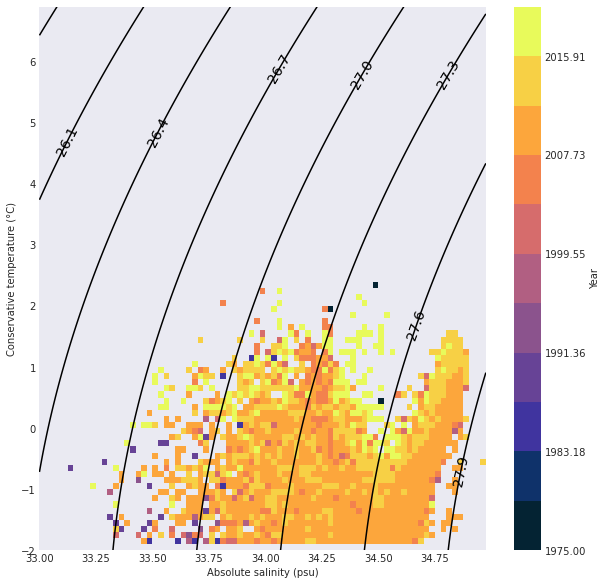

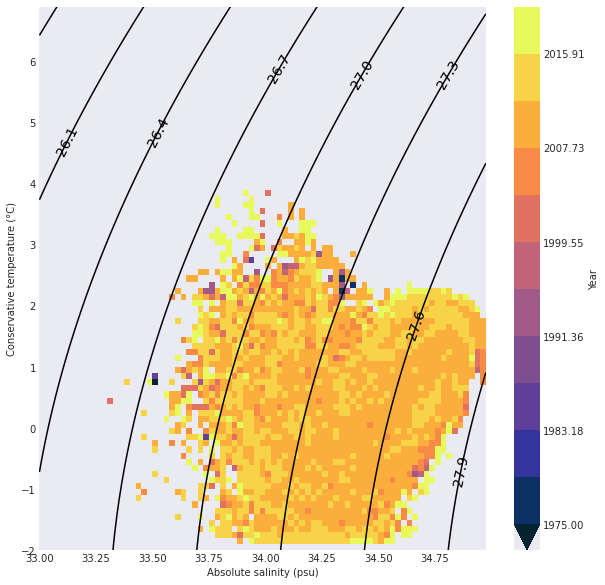

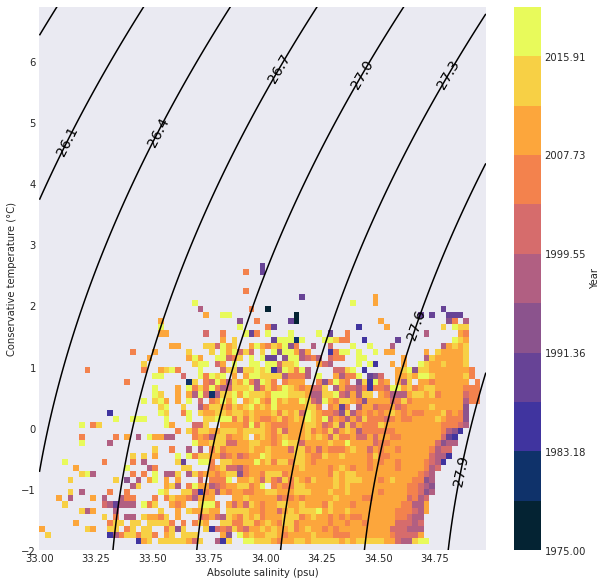

In [187]:
pt.plot_hist_TS(ploc, dfp, n_components_selected,
                sbins = np.arange(33, 35, 0.025), 
                tbins = np.arange(-2, 7, 0.1),
                vartype='year',
                crange=[1975, 2020],
                colormap=cmocean.cm.thermal)

plot_tools.plot_hist_map


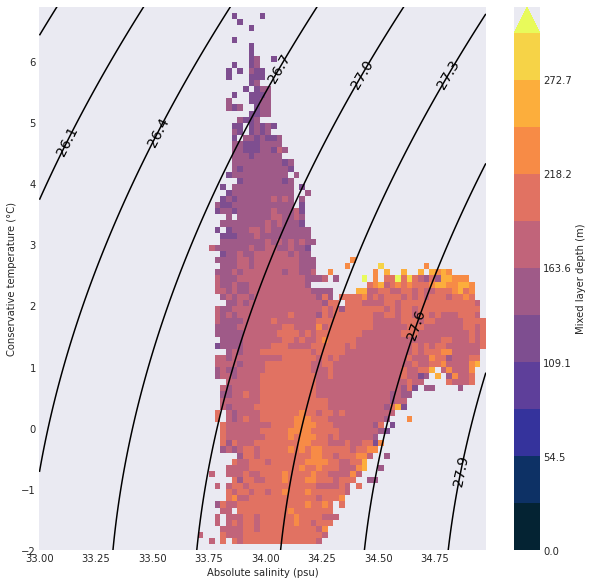

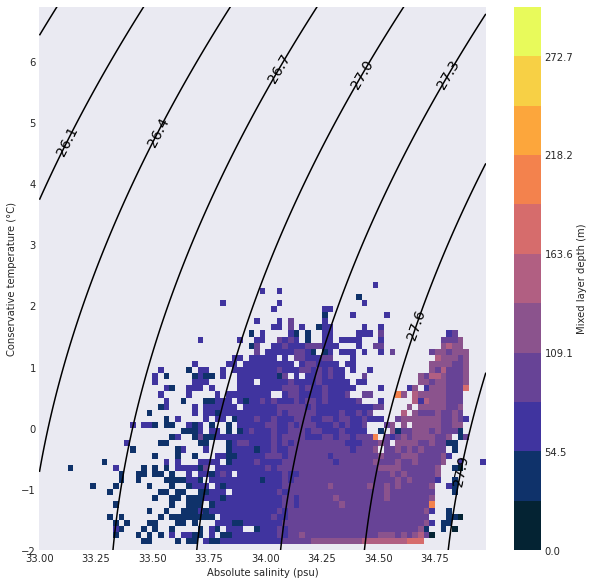

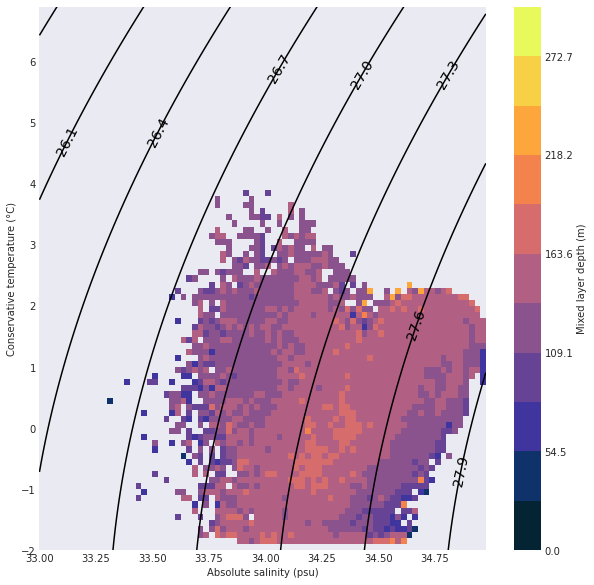

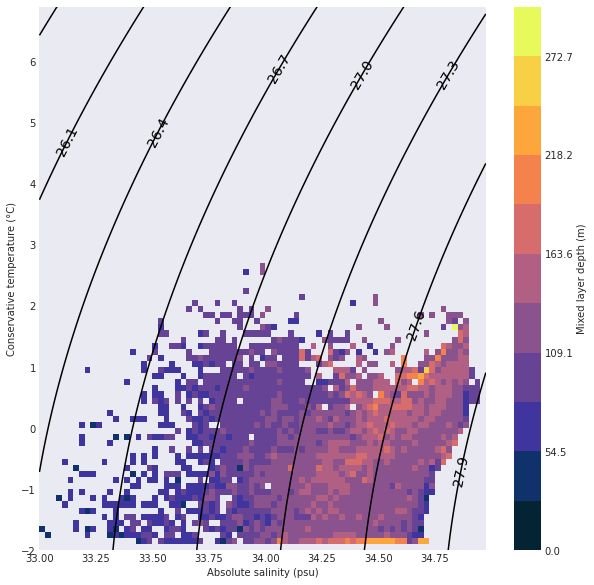

In [189]:
pt.plot_hist_TS(ploc, dfp, n_components_selected,
                sbins = np.arange(33, 35, 0.025), 
                tbins = np.arange(-2, 7, 0.1),
                vartype='mld',
                crange=[0, 300],
                colormap=cmocean.cm.thermal)

plot_tools.plot_hist_map


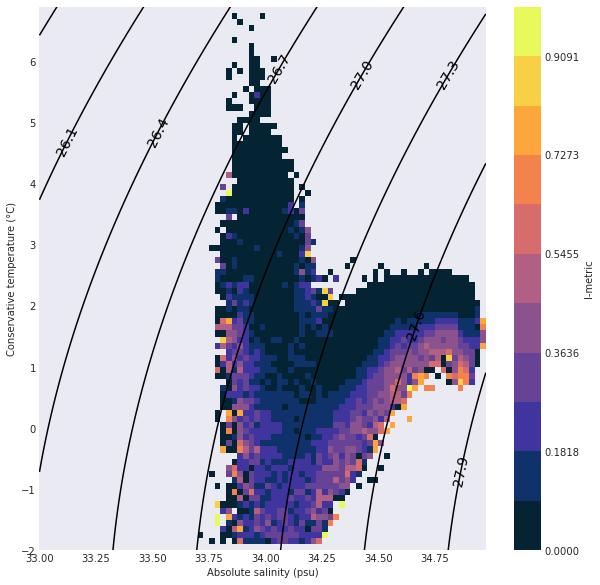

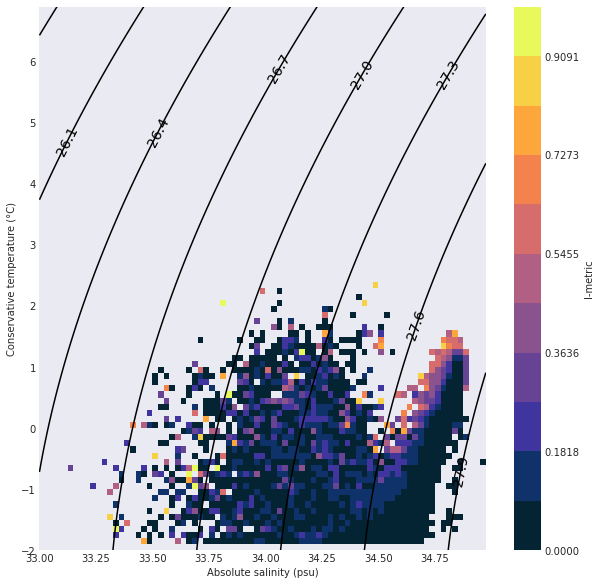

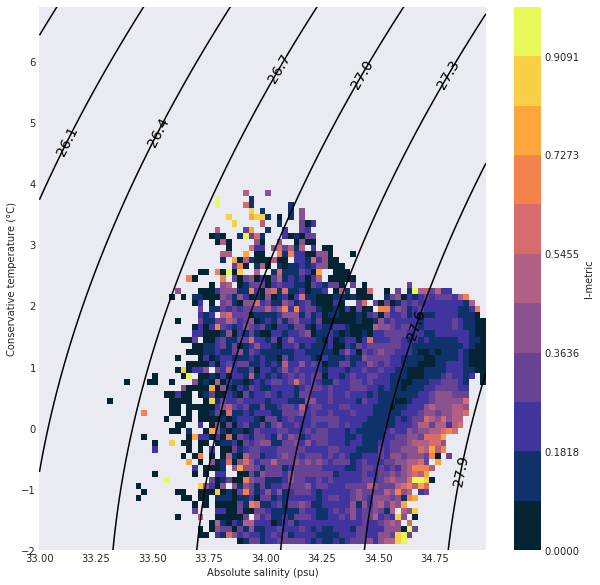

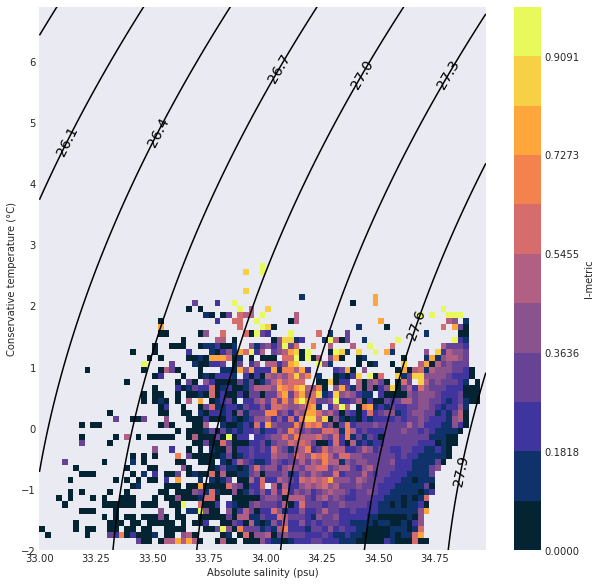

In [190]:
pt.plot_hist_TS(ploc, dfp, n_components_selected,
                sbins = np.arange(33, 35, 0.025), 
                tbins = np.arange(-2, 7, 0.1),
                vartype='imetric',
                crange=[0, 1],
                colormap=cmocean.cm.thermal)

# Get mean label in each 1x1 bin

plot_tools.plot_hist_map
file_io.load_bathymetry


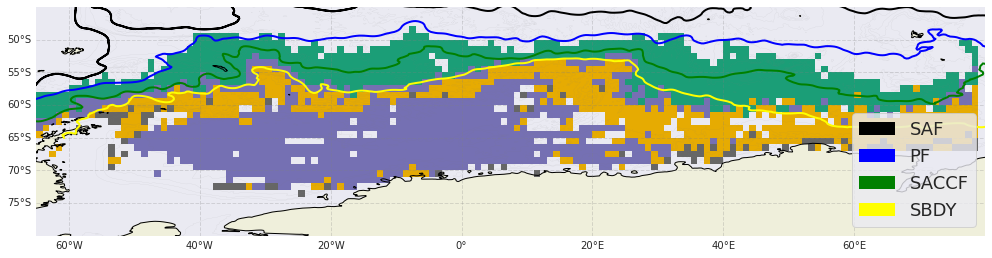

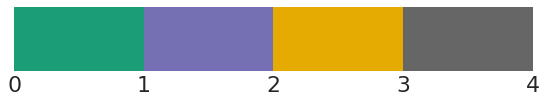

In [246]:
pt.plot_hist_map(ploc, dfp,
                 lon_range, lat_range,
                 n_components_selected,
                 c_range=[0,4],
                 vartype='label',
                 colormap=colormap,
                 binsize=1,
                 bathy_fname='bathy.nc',
                 lev_range=range(-6000,1,1000),
                 legend_font_size=18)